# Libraries

In [60]:
from pathlib import Path
from cobra.io import read_sbml_model, write_sbml_model
import pandas as pd
import numpy as np
import cobra
from cobra.flux_analysis import flux_variability_analysis
from cobra.io import load_model
from cobra import Model, Reaction, Metabolite
from cobra.flux_analysis import (
    single_gene_deletion, single_reaction_deletion, double_gene_deletion,
    double_reaction_deletion)

In [61]:
!pip install matplotlib
import matplotlib.pyplot as plt

Defaulting to user installation because normal site-packages is not writeable


## Set Solver

In [62]:
from cobra import Configuration

config = Configuration()
print("Default solver:", config.solver)

# Change solver if needed
config.solver = "glpk"

Default solver: <module 'optlang.glpk_interface' from 'C:\\Users\\Anand\\AppData\\Local\\Packages\\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\\LocalCache\\local-packages\\Python312\\site-packages\\optlang\\glpk_interface.py'>


# Load Models

In [449]:
model= read_sbml_model("C:/Lenovo Laptop Data/user data/Downloads/DAAD DDP/Computational/iUma22_Transporter.sbml")

In [ ]:
#Load Yeast Model
yeast8 = Path("C:/Lenovo Laptop Data/user data/Downloads/DAAD DDP/Computational/yeast9_itaconic.sbml")
yeast8 = yeast8.resolve()
yeast8_model_cp= read_sbml_model(str(yeast8))
#write_sbml_model(yeast8_model_cp, "yeast9_itaconic.sbml")

In [3]:
biomass_id= "BIOMASS_REACTION"
itaconate_id= "Putative_Itaconate_Transporter"

# Assisting Codes

## Search Word based finding

In [ ]:
# For models following different annotation conventions

In [ ]:
# find word in metabolites
search_word='carnitine'
for metabolite in yeast8_model_cp.metabolites:
    if search_word in metabolite.name:
        print(f"ID: {metabolite.id}, Name: {metabolite.name}, , Compartment: {metabolite.compartment}")

In [ ]:
# find word in reactions
search_word='ATP'
for metabolite in yeast8_model_cp.reactions:
    if search_word in metabolite.name:
        print(f"ID: {metabolite.id}, Name: {metabolite.name}")

In [111]:
model.genes.get_by_id('UMAG_05869')

Gene identifier,UMAG_05869
Name,UMAG_05869
Memory address,0x2251fe9c410
Functional,True
In 2 reaction(s),"TRANS_CARNITINE-Translocase, TRANS_O-ACETYLCARNITINE-Translocase"


In [124]:
model.reactions.get_by_id('TK1')

KeyError: 'TK1'

## Summary and finding reaction, metabolite information

In [ ]:
yeast8_model_cp.reactions.get_by_id('r_1832')

In [ ]:
yeast8_model_cp.metabolites.get_by_id('s_0794')

In [ ]:
yeast8_model_cp.metabolites.get_by_id('s_0796').summary()

In [ ]:
print(model.medium)

In [ ]:
# Searching for a metabolite in all reactions
for rxn in model.reactions:
    # Print reactions that involve acetate (either as 'ac_c' or 'ac_e')
    if 'ac_c' in rxn.metabolites or 'ac_e' in rxn.metabolites:
        print(f"Reaction ID: {rxn.id}, Reaction: {rxn.reaction}")

In [458]:
# Function to find reactions with a specific metabolite as product
def find_reactions_with_product(product_met):
    """Find all reactions where product_met is a product in the reaction."""
    matching_reactions = []
    
    for rxn in model.reactions:
        products = {met.id for met in rxn.products}
        
        # Check if the given metabolite is in the products list
        if product_met in products:
            matching_reactions.append(rxn)  # Add the reaction object to the list
    
    return matching_reactions

product_met = "atp_m"  
# Get all reactions matching the condition
reactions = find_reactions_with_product(product_met)

# Print the results in a table format
if reactions:
    print(f"Reactions with {product_met} as product:")
    print(f"{'Reaction ID':<20} {'Reaction Name':<40} {'Reaction Equation'}")
    print("="*80)  # Separator line
    
    # Loop through each matching reaction
    for rxn in reactions:
        reaction_id = rxn.id
        reaction_name = rxn.name if rxn.name else "No name"
        reaction_equation = rxn.build_reaction_string()  # Get the reaction equation
        
        # Get metabolites with names and IDs for both reactants and products
        reactant_info = ", ".join([f"{met.name} ({met.id})" for met in rxn.reactants])
        product_info = ", ".join([f"{met.name} ({met.id})" for met in rxn.products])
        
        # Print the reaction details in table format
        print(f"{reaction_id:<20} {reaction_name:<40} {reactant_info} -> {product_info}")
else:
    print(f"No reactions found with {product_met} as product.")


Reactions with atp_m as product:
Reaction ID          Reaction Name                            Reaction Equation
SUCOASm              SUCCCOASYN-RXN                           ADP (adp_m), phosphate (pi_m), succinyl-CoA (succoa_m) -> ATP (atp_m), coenzyme A (coa_m), succinate (succ_m)
ATPasel              ATPSYN-RXN                               ADP (adp_m), H+ (h_p), phosphate (pi_m) -> ATP (atp_m), H2O (h2o_m), H+ (h_m)


In [456]:
find_reactions_with_product('atp_c')

[<Reaction PYK at 0x2253c95a600>,
 <Reaction TRANS-RXNTFS-14-ATP1072 at 0x225c5bf4530>,
 <Reaction TRANS-RXNTFS-27-ATP1150 at 0x2258c1b7e90>,
 <Reaction TRANS-RXNTFS-60 at 0x225f21e7080>,
 <Reaction CARBAMATE-KINASE-RXN at 0x225c9a66750>,
 <Reaction TRANS-RXNTFS-46-CYTOSINE1522 at 0x225a81f6e40>,
 <Reaction TRANS_Adenine_Nucleotide_Transporter at 0x2259f7a77a0>,
 <Reaction E4PK at 0x225aad5fad0>]

In [43]:
def find_reactions_with_reactant(reactant_met):
    """Find all reactions where reactant_met is a reactant in the reaction."""
    matching_reactions = []
    
    for rxn in model.reactions:
        reactants = {met.id for met in rxn.reactants}
        
        # Check if the given metabolite is in the reactants list
        if reactant_met in reactants:
            matching_reactions.append(rxn)  # Add the reaction object to the list
    
    return matching_reactions

# Example metabolite (replace with your desired reactant metabolite)
reactant_met = "h_c"  # Replace with your desired reactant metabolite ID

# Get all reactions matching the condition
reactions = find_reactions_with_reactant(reactant_met)

# Print the results in a table format
if reactions:
    print(f"Reactions with {reactant_met} as reactant:")
    print(f"{'Reaction ID':<20} {'Reaction Name':<40} {'Reaction Equation'}")
    print("="*80)  # Separator line
    
    # Loop through each matching reaction
    for rxn in reactions:
        reaction_id = rxn.id
        reaction_name = rxn.name if rxn.name else "No name"
        reaction_equation = rxn.build_reaction_string()  # Get the reaction equation
        
        # Get metabolites with names and IDs for both reactants and products
        reactant_info = ", ".join([f"{met.name} ({met.id})" for met in rxn.reactants])
        product_info = ", ".join([f"{met.name} ({met.id})" for met in rxn.products])
        
        # Print the reaction details in table format
        print(f"{reaction_id:<20} {reaction_name:<40} {reactant_info} -> {product_info}")
else:
    print(f"No reactions found with {reactant_met} as reactant.")


Reactions with h_c as reactant:
Reaction ID          Reaction Name                            Reaction Equation
RXN-14790            RXN-14790                                2-trans, 4-trans-undecadienoyl-CoA (CPD-15661_c), H+ (h_c), NADPH (nadph_c) -> 3-trans-undecenoyl-CoA (CPD-15655_c), NADP+ (nadp_c)
RXN-14577            RXN-14577                                2-trans,5-cis-tetradecadienoyl-CoA (CPD0-1162_c), coenzyme A (coa_c), H2O (h2o_c), H+ (h_c), NAD+ (nad_c), oxygen (o2_c) -> 3-cis-dodecenoyl-CoA (CPD-7221_c), acetyl-CoA (accoa_c), hydrogen peroxide (h2o2_c), NADH (nadh_c)
RXN-14776            RXN-14776                                2-trans, 4-cis-undecadienoyl-CoA (CPD-15654_c), H+ (h_c), NADPH (nadph_c) -> 3-trans-undecenoyl-CoA (CPD-15655_c), NADP+ (nadp_c)
BENZOATE-4-MONOOXYGENASE-RXN BENZOATE-4-MONOOXYGENASE-RXN             benzoate (bz_c), H+ (h_c), NADPH (nadph_c), oxygen (o2_c) -> 4-hydroxybenzoate (4hbz_c), H2O (h2o_c), NADP+ (nadp_c)
PNORn                2-DEHYDRO

## Blocked Reactions Identification

In [ ]:
#finding blocked reactions
from cobra.flux_analysis import find_blocked_reactions
blocked = find_blocked_reactions(model)
print("Blocked reactions:", blocked)

In [ ]:
# getting change in blocked reactions under different media conditions
# Function to get blocked reactions based on the current media constraints
def get_blocked_reactions(model):
    solution = model.optimize()
    blocked_reactions = []
    if solution.status == "optimal":
        # Collect reactions that are blocked (fluxes are near-zero)
        blocked_reactions = [
            rxn.id for rxn in model.reactions if abs(solution.fluxes[rxn.id]) < 1e-6
        ]
    else:
        print("Model optimization is infeasible!")
    return blocked_reactions

# Set the model to grow on glucose
# Block acetate uptake
EX_glc__D_e = model.reactions.get_by_id('EX_glc__D_e')
EX_ac_e = model.reactions.get_by_id('EX_ac_e')

# Allow glucose and block acetate
EX_glc__D_e.bounds = (-1000, 1000)  # allow glucose uptake
EX_ac_e.bounds = (0, 0)  # block acetate uptake

# Get blocked reactions when growing on glucose
blocked_reactions_glucose = get_blocked_reactions(model)

# Set the model to grow on acetate
# Block glucose uptake and allow acetate
EX_glc__D_e.bounds = (0, 0)  # block glucose uptake
EX_ac_e.bounds = (-1000, 1000)  # allow acetate uptake

# Get blocked reactions when growing on acetate
blocked_reactions_acetate = get_blocked_reactions(model)

# Compare and find reactions blocked only when growing on acetate
blocked_only_on_acetate = list(set(blocked_reactions_acetate) - set(blocked_reactions_glucose))

# Debugging: Print information to understand the situation
print(f"Blocked reactions on glucose: {blocked_reactions_glucose}")
print(f"Blocked reactions on acetate: {blocked_reactions_acetate}")
print(f"Reactions blocked only when growing on acetate: {blocked_only_on_acetate}")


## Significant Reactions

In [ ]:
solution = model.optimize()
if solution.status == 'optimal':
    print(f"Optimal growth rate: {solution.objective_value}")
else:
    print("No optimal solution found.")

In [47]:
model.reactions.get_by_id('EX_h_e').bounds= -8.8, 1000.0

In [58]:
significant_reactions = [
    [
        model.reactions[RctIdx].name,
        solution.to_frame().iloc[RctIdx].name,
        model.reactions[RctIdx].reaction,
        round(solution.fluxes[RctIdx], 2)
    ]
    for RctIdx in np.where(np.abs(solution.fluxes) > 0.5)[0]
]
 
# Create a DataFrame for better visualization
df = pd.DataFrame(significant_reactions, columns=["Reaction Name", "Reaction ID", "Reaction Equation", "Flux"])
 
# Print the DataFrame
df

C:\Users\Anand\AppData\Local\Temp\ipykernel_23964\4093449163.py:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  round(solution.fluxes[RctIdx], 2)


,Reaction Name,Reaction ID,Reaction Equation,Flux
0,METHANOL-DEHYDROGENASE-RXN,ALCD1,meoh_c + nad_c --> fald_c + h_c + nadh_c,0.59
1,RXN-14189,PRDXl,h2o2_c + meoh_c <=> fald_c + 2.0 h2o_c,-0.59
2,External alternative NADH-ubiquinone oxidoredu...,NDH2m,h_c + nadh_c + q6_m --> nad_c + q6h2_m,0.59
3,ATPSYN-RXN,ATPasel,adp_m + 4.0 h_p + pi_m --> atp_m + h2o_m + 3.0...,0.66
4,Adenine Nucleotide Transport,TRANS_Adenine_Nucleotide_Transporter,adp_c + atp_m --> adp_m + atp_c,0.66
5,Phosphate Transport Simplified,TRANS_Phosphate_Transporter,h_c + pi_c --> h_m + pi_m,0.66
6,Water Porines Mitochondrion,TRANS_Water_Uptake_Mito,h2o_c <=> h2o_m,-1.25
7,Aerobic Respiration Ubiquinol-Cytochrome-C-Red...,CYOR_u6m_umay,2.0 ficytc_m + 1.5 h_m + q6h2_m --> 2.0 focytc...,0.59
8,NGAM Artificial reaction,NGAM,atp_c + h2o_c --> adp_c + h_c + pi_c,0.66


## Graphical Representation of Increasing Substrate

In [ ]:
import re
# Make Glucose exchange reaction lb as 0 and increase acetate reaction bound to -1000; optimise for biomass, itaconate and the combination
reaction_acetate= model.reactions.get_by_id('TRANS-RXNTFS-1-ACET1223')
reaction_acetate_consumption= model.reactions.get_by_id('ACSp')
reaction_glucose= model.reactions.get_by_id('EX_glc__D_e')
reaction_glucose.lower_bound= -0.3
#tried 0, -0.1, -0.2- seems gradient start working at -0.3, simulating a gradient (use geometric progression with multiplier 2?) and a graph
def gp(multiplier, max_value):
    value = 0.3  # Starting value
    solution_itaconate= []
    solution_biomass=[]
    gprogression = []
    while value <= max_value:
        value *= multiplier
        gprogression.append(value)
        reaction_glucose.lower_bound= -value
        #reaction_acetate.lower_bound=- value
        model.objective=biomass_id
        sol_biomass=model.optimize()
        solution_biomass.append(sol_biomass)
        model.objective=itaconate_id
        sol_itaconate=model.optimize()
        solution_itaconate.append(sol_itaconate)
    return gprogression, solution_itaconate, solution_biomass

uptake,itaconate_production, biomass_production= gp(2, 1000)
#print (uptake)
#print(itaconate_production)
#print(biomass_production)
#print(dir(itaconate_production[0]))
itaconate_production =  [float(str(item).split()[1]) for item in itaconate_production]
biomass_production =  [float(str(item).split()[1]) for item in biomass_production]
print (itaconate_production)
print(biomass_production)
fig, ax1 = plt.subplots()

ax1.plot(uptake, itaconate_production, color='magenta', marker='o', label='Y1 - Primary Axis')
ax1.set_xlabel('Glucose Uptake Flux')
ax1.set_ylabel('Itaconate Flux', color='magenta')
ax1.tick_params(axis='y', labelcolor='magenta')

ax2 = ax1.twinx()
ax2.plot(uptake, biomass_production, color='blue', marker='s', linestyle='--', label='Y2 - Secondary Axis')
ax2.set_ylabel('Biomass Flux', color='blue')
ax2.tick_params(axis='y', labelcolor='blue')

plt.title('Itaconate and Biomass on different fluxes of glucose')
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

## Modifications

In [450]:
# to enable acetate uptake
model.add_boundary(model.metabolites.get_by_id("h_e"), type="exchange")
model.reactions.get_by_id('EX_h_e').bounds= -8.8, 1000.0

In [54]:
model.reactions.get_by_id('NGAM')

Reaction identifier,NGAM
Name,NGAM Artificial reaction
Memory address,0x22510f22150
Stoichiometry,atp_c + h2o_c --> adp_c + pi_c ATP + H2O --> ADP + phosphate
GPR,
Lower bound,0.66
Upper bound,1000.0


In [ ]:
summary = model.metabolites.get_by_id('o2_c').summary()
summary

In [213]:
summary = model.metabolites.get_by_id('h2o2_c').summary()
summary

Percent,Flux,Reaction,Definition
100.00%,0.8102,RXN-11026-STEAROYL-COA76,o2_c + stcoa_c --> h2o2_c + od2coa_c
Percent,Flux,Reaction,Definition
66.67%,-0.5401,RXN-3521,2.0 ascb__L_c + h2o2_c --> 2.0 CPD-318_c + 2.0 h2o_c
33.33%,-0.2701,THIORDXp,h2o2_c + trdrd_c <=> 2.0 h2o_c + trdox_c


In [212]:
model.reactions.get_by_id('CATp')

Reaction identifier,CATp
Name,CATAL-RXN
Memory address,0x22539910fb0
Stoichiometry,2.0 h2o2_c --> 2.0 h2o_c + o2_c 2.0 hydrogen peroxide --> 2.0 H2O + oxygen
GPR,UMAG_11067
Lower bound,0.0
Upper bound,1000.0


In [451]:
o2_producing_reaction= model.reactions.get_by_id('CATp')
o2_producing_reaction.bounds=(0, 0.2)

C:\Users\Anand\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\cobra\util\solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


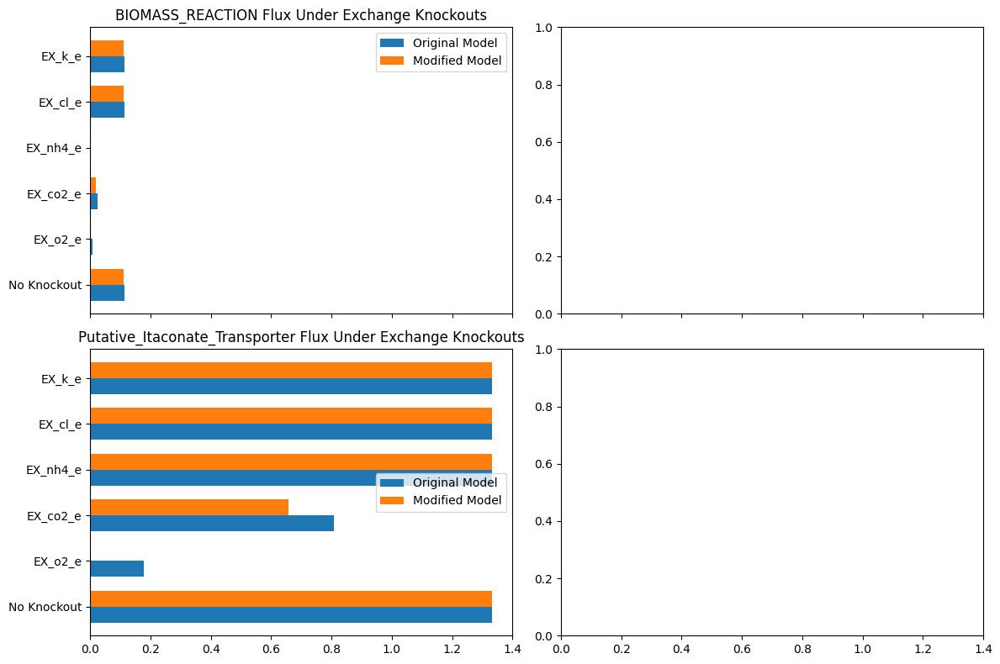

In [219]:


def optimize_and_store_fluxes(model, objective, exchange_reactions):
    model.objective = objective
    solution = model.optimize()
    fluxes = {"original": solution.fluxes.get(objective, 0)}
    
    for rxn in exchange_reactions:
        model.reactions.get_by_id(rxn).bounds = (0, 0)
        solution = model.optimize()
        fluxes[rxn] = solution.fluxes.get(objective, 0)
        model.reactions.get_by_id(rxn).bounds = (-1000, 1000)  # Reset bounds
    
    return fluxes

def compare_fluxes(model, reaction_to_delete, save_modified_model):
    exchange_reactions = ["EX_o2_e", "EX_co2_e", "EX_nh4_e", "EX_cl_e", "EX_k_e"]
    objective_reactions = ["BIOMASS_REACTION", "Putative_Itaconate_Transporter"]
    
    # Compute fluxes for original model
    original_fluxes = {}
    for obj in objective_reactions:
        original_fluxes[obj] = optimize_and_store_fluxes(model, obj, exchange_reactions)
    
    o2_producing_reaction= model.reactions.get_by_id('CATp')
    o2_producing_reaction.bounds=(0,0.2)
    
    # Compute fluxes for modified model
    modified_fluxes = {}
    for obj in objective_reactions:
        modified_fluxes[obj] = optimize_and_store_fluxes(model, obj, exchange_reactions)
    
    # Save the modified model
    if save_modified_model:
        cobra.io.write_sbml_model(model, "modified_model.xml")
    
    # Plot the results
    fig, axs = plt.subplots(2, 2, figsize=(12, 8), sharex=True)
    width = 0.35  
    
    for i, obj in enumerate(objective_reactions):
        y = np.arange(len(exchange_reactions) + 1)
        axs[i, 0].barh(y - width/2, [original_fluxes[obj][rxn] for rxn in ["original"] + exchange_reactions], width, label='Original Model')
        axs[i, 0].barh(y + width/2, [modified_fluxes[obj][rxn] for rxn in ["original"] + exchange_reactions], width, label='Modified Model')
        axs[i, 0].set_title(f"{obj} Flux Under Exchange Knockouts")
        axs[i, 0].set_yticks(y)
        axs[i, 0].set_yticklabels(["No Knockout"] + exchange_reactions)
        axs[i, 0].legend()
    
    plt.tight_layout()
    plt.show()

# Example usage:
compare_fluxes(model, "CATp", save_modified_model=True)

## NGAM spike up with exchange for H+ setup

In [404]:
model.reactions.get_by_id('EX_h_e').bounds=-1000, 1000.0 # use ode to find optimal exchange value in combination with NGAM and original growth rate

In [42]:
model.reactions.get_by_id('NGAM').bounds= 0.66, 1000.0
model.reactions.get_by_id('EX_glc__D_e').bounds = 0.0, 0.0  # Glucose uptake rate set to 0 (glucose-limited)
model.reactions.get_by_id('EX_ac_e').bounds = -10.0, 1000
model.objective = 'BIOMASS_REACTION'
solution = model.optimize()
if solution.status == 'optimal':
    print(f"Optimal growth rate: {solution.objective_value}")
else:
    print("No optimal solution found.")

Optimal growth rate: -2.197808784275891e-17


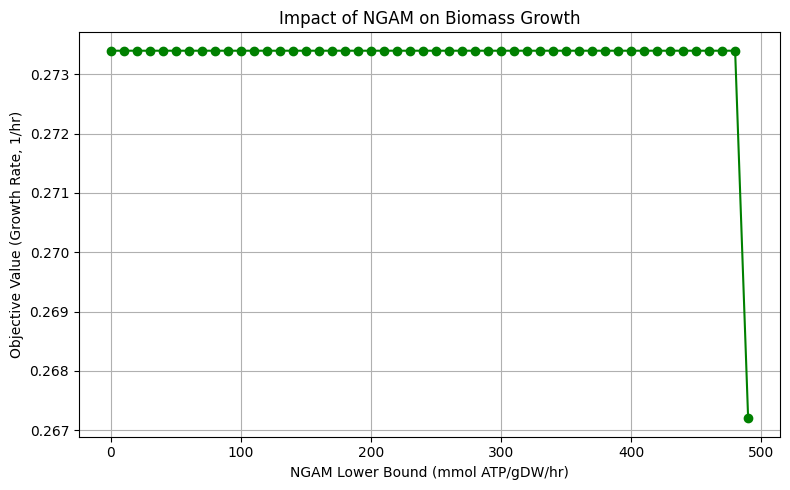

In [405]:
import cobra
import matplotlib.pyplot as plt

# Assume model is already loaded and 'NGAM' is the correct ID
ngam_rxn = model.reactions.get_by_id('NGAM')
original_bounds = ngam_rxn.bounds

# Range of NGAM values (e.g., 0 to 20 mmol ATP/gDW/hr)
ngam_values = list(range(0, 500, 10))
growth_values = []

for lb in ngam_values:
    ngam_rxn.lower_bound = lb
    solution = model.optimize()
    if solution.status == 'optimal':
        growth_values.append(solution.objective_value)
    else:
        growth_values.append(0.0)  # No growth if infeasible

# Restore original bounds
ngam_rxn.bounds = original_bounds

# Plot
plt.figure(figsize=(8, 5))
plt.plot(ngam_values, growth_values, marker='o', linestyle='-', color='green')
plt.title("Impact of NGAM on Biomass Growth")
plt.xlabel("NGAM Lower Bound (mmol ATP/gDW/hr)")
plt.ylabel("Objective Value (Growth Rate, 1/hr)")
plt.grid(True)
plt.tight_layout()
plt.show()


## Checking for Substrate Utilization

[0.705, 1.43, 2.878, 5.76, 11.52, 23.04, 46.08, 92.16, 184.32, 342.728, 500.173, 557.778]
[0.053, 0.109, 0.22, 0.443, 0.815, 1.485, 2.825, 5.504, 10.862, 21.193, 26.395, 26.982]


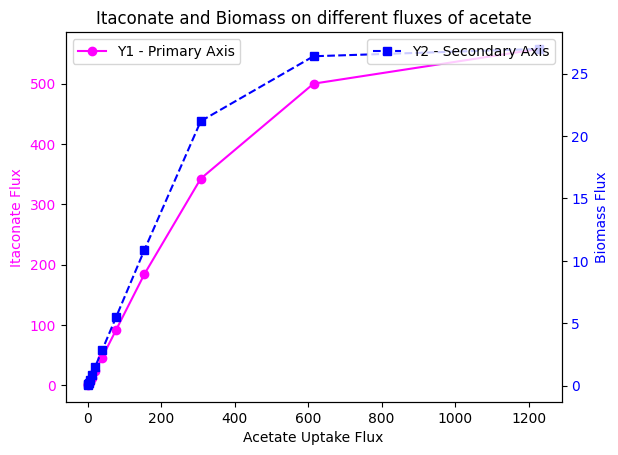

In [156]:
import re
# Make Glucose exchange reaction lb as 0 and increase acetate reaction bound to -1000; optimise for biomass, itaconate and the combination
reaction_acetate= model.reactions.get_by_id('TRANS-RXNTFS-1-ACET1223')
reaction_acetate_consumption= model.reactions.get_by_id('EX_ac_e')
reaction_glucose= model.reactions.get_by_id('EX_glc__D_e')
reaction_acetate.lower_bound= -0.3
#tried 0, -0.1, -0.2- seems gradient start working at -0.3, simulating a gradient (use geometric progression with multiplier 2?) and a graph
def gp(multiplier, max_value):
    value = 0.3  # Starting value
    solution_itaconate= []
    solution_biomass=[]
    gprogression = []
    while value <= max_value:
        value *= multiplier
        gprogression.append(value)
        reaction_glucose.lower_bound= -value
        #reaction_acetate.lower_bound=- value
        model.objective=biomass_id
        sol_biomass=model.optimize()
        solution_biomass.append(sol_biomass)
        model.objective=itaconate_id
        sol_itaconate=model.optimize()
        solution_itaconate.append(sol_itaconate)
    return gprogression, solution_itaconate, solution_biomass

uptake,itaconate_production, biomass_production= gp(2, 1000)
#print (uptake)
#print(itaconate_production)
#print(biomass_production)
#print(dir(itaconate_production[0]))
itaconate_production =  [float(str(item).split()[1]) for item in itaconate_production]
biomass_production =  [float(str(item).split()[1]) for item in biomass_production]
print (itaconate_production)
print(biomass_production)
fig, ax1 = plt.subplots()

ax1.plot(uptake, itaconate_production, color='magenta', marker='o', label='Y1 - Primary Axis')
ax1.set_xlabel('Acetate Uptake Flux')
ax1.set_ylabel('Itaconate Flux', color='magenta')
ax1.tick_params(axis='y', labelcolor='magenta')

ax2 = ax1.twinx()
ax2.plot(uptake, biomass_production, color='blue', marker='s', linestyle='--', label='Y2 - Secondary Axis')
ax2.set_ylabel('Biomass Flux', color='blue')
ax2.tick_params(axis='y', labelcolor='blue')

plt.title('Itaconate and Biomass on different fluxes of acetate')
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

## Saving Model

In [ ]:
sbml_filename= "C:/Lenovo Laptop Data/user data/Downloads/DAAD DDP/Computational/model_modified.sbml"
cobra.io.read_sbml_model(model, sbml_filename)

# Predicting K/Os and O/Es

## FBA (Flux Tradeof)

C:\Users\Anand\AppData\Local\Temp\ipykernel_23964\867199479.py:34: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_knockouts= pd.concat([df_knockouts, df_knockouts_temp], ignore_index=True)


[np.float64(9.972729080415423e-17), np.float64(0.8431254710175164), np.float64(0.843125471017468), np.float64(0.8431254710176983), np.float64(0.843125471017468), np.float64(0.8431254710176983), np.float64(0.843125471017468), np.float64(0.8431254710176983), np.float64(-2.590895234622527e-16), np.float64(0.8431254710175216), np.float64(0.8431254710175825), np.float64(0.8431254710174653), np.float64(-1.619309521639079e-16), np.float64(0.8431254710175169), np.float64(0.8431254710174653), np.float64(0.8431254710173721), np.float64(0.8431254710175538), np.float64(0.8431254710174921), np.float64(7.45819739284461e-14), np.float64(0.8431254710174148), np.float64(0.8431254710175218), np.float64(0.8431254710177027), np.float64(0.8431254710174921), np.float64(0.8431254710177027), np.float64(0.8431254710174921), np.float64(0.8431254710177027), np.float64(0.8431254710174921), np.float64(0.8431254710177027), np.float64(0.8431254710174921), np.float64(0.8431254710177027), np.float64(0.8431254710174921

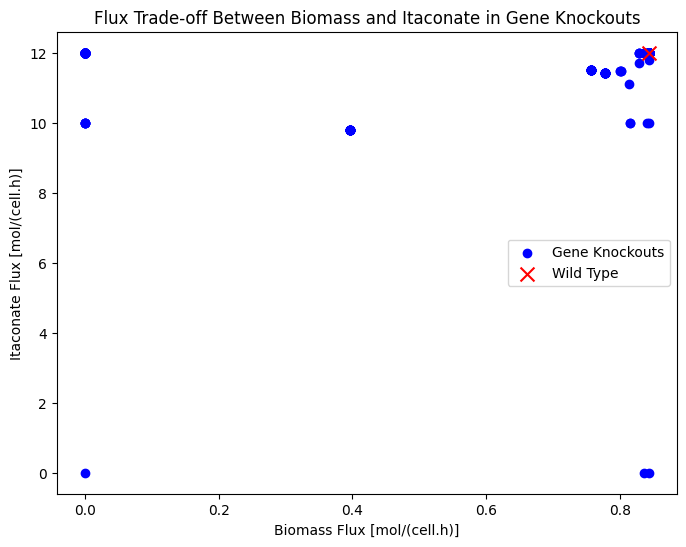

In [ ]:
model.reactions.get_by_id('EX_glc__D_e').bounds = 0.0, 0.0  # Glucose uptake rate set to 0 (glucose-limited)
model.reactions.get_by_id('EX_ac_e').bounds = -4.0, 1000 # Acetate uptake rate set to -4 (similar to exp)
x_biomass_flux = []
y_itaconate_flux = []
gene_id_label=[]
biomass_id='BIOMASS_REACTION'
itaconate_id= 'Putative_Itaconate_Transporter'
# initiate df for biomass and itaconate flux values for each knockout
df_knockouts = pd.DataFrame(columns=['Gene Knocked Out', 'Itaconate Flux', 'Biomass Flux'])

# WT biomass flux
model.objective = biomass_id
solution_wt_biomass = model.optimize()
wt_biomass_flux = solution_wt_biomass.fluxes[biomass_id]

# WT itaconate flux
model.objective = itaconate_id
solution_wt_itaconate = model.optimize()
wt_itaconate_flux = solution_wt_itaconate.fluxes[itaconate_id]
# loop to knockout single genes and see effect on biomass and itaconate, optimising for both separately
for gene in model.genes:
    with model as model:
        gene_id=gene.id
        gene.knock_out()
        model.objective = biomass_id
        solution_biomass = model.optimize()
        biomass_flux = solution_biomass.fluxes[biomass_id]
        x_biomass_flux.append(biomass_flux)
        model.objective = itaconate_id
        solution_itaconate = model.optimize()
        itaconate_flux = solution_itaconate.fluxes[itaconate_id]
        y_itaconate_flux.append(itaconate_flux)
        df_knockouts_temp= pd.DataFrame({'Gene Knocked Out':[gene_id], 'Gene Reaction Rules':[gene.name],'Itaconate Flux':[itaconate_flux], 'Biomass Flux': [biomass_flux]})
        df_knockouts= pd.concat([df_knockouts, df_knockouts_temp], ignore_index=True)
        
# Plot Flux Tradeoff
print (x_biomass_flux)   
print (y_itaconate_flux) 
print (gene_id_label)
print(df_knockouts)
df_knockouts.to_csv('Knockouts_separate_objectives_modified_model.csv')
plt.figure(figsize=(8, 6))
plt.scatter(x_biomass_flux, y_itaconate_flux, color='b', label='Gene Knockouts')
plt.scatter(wt_biomass_flux, wt_itaconate_flux, color='red', marker='x', s=100, label='Wild Type')
plt.xlabel("Biomass Flux [mol/(cell.h)]")
plt.ylabel("Itaconate Flux [mol/(cell.h)]")

plt.title("Flux Trade-off Between Biomass and Itaconate in Gene Knockouts")
plt.legend()
plt.show()


## Weighted FBA

C:\Users\Anand\AppData\Local\Temp\ipykernel_23964\1562757949.py:40: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_knockouts= pd.concat([df_knockouts, df_knockouts_temp], ignore_index=True)
C:\Users\Anand\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\cobra\util\solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)


[np.float64(-3.767955309648753e-17), np.float64(0.037151648493098995), np.float64(0.037151648493098766), np.float64(0.037151648493098766), np.float64(0.037151648493098766), np.float64(0.037151648493098766), np.float64(0.037151648493098766), np.float64(0.037151648493098766), np.float64(8.42612426486999e-18), np.float64(0.037151648493098814), np.float64(0.03715164849309929), np.float64(0.03715164849309929), np.float64(-1.6815085911623962e-17), np.float64(0.037151648493098814), np.float64(0.037151648493099536), np.float64(0.037151648493099536), np.float64(0.037151648493099536), np.float64(0.037151648493099536), np.float64(2.233200349476024e-14), np.float64(0.03715164849309902), np.float64(0.03715164849309929), np.float64(0.03715164849309929), np.float64(0.03715164849309929), np.float64(0.03715164849309929), np.float64(0.03715164849309929), np.float64(0.03715164849309929), np.float64(0.03715164849309929), np.float64(0.03715164849309929), np.float64(0.03715164849309929), np.float64(0.037151

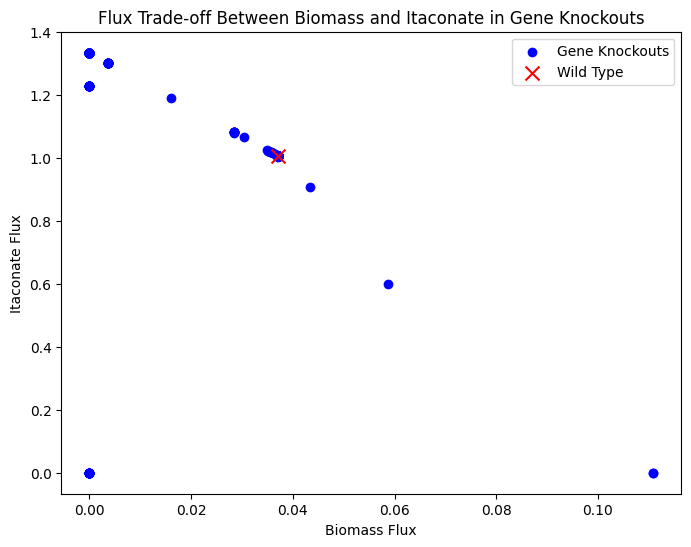

In [ ]:
model.reactions.get_by_id('EX_glc__D_e').bounds = 0.0, 0.0
model.reactions.get_by_id('EX_ac_e').bounds = -4.0, 1000

x_biomass_flux = []
y_itaconate_flux = []
gene_id_label=[]
biomass_id='BIOMASS_REACTION'
itaconate_id= 'Putative_Itaconate_Transporter'
df_knockouts = pd.DataFrame(columns=['Gene Knocked Out', 'Itaconate Flux', 'Biomass Flux'])
# Get wild-type fluxes under weighted objective 
biomass_flux_expr = model.reactions.get_by_id(biomass_id).flux_expression
product_flux_expr = model.reactions.get_by_id(itaconate_id).flux_expression
model.objective = (0.92) * biomass_flux_expr + (0.08) * product_flux_expr
solution_wt = model.optimize()
wt_biomass_flux = solution_wt.fluxes[biomass_id]
wt_itaconate_flux = solution_wt.fluxes[itaconate_id]

# loop through all gene knockouts and co-optimise for biomass and itaconate 
# and record their fluxes after optimisation
for gene in model.genes:
    with model as model:
        gene_id=gene.id
        gene.knock_out()
        biomass_flux_expr = model.reactions.get_by_id(biomass_id).flux_expression
        product_flux_expr = model.reactions.get_by_id(itaconate_id).flux_expression
        model.objective = (0.92) * biomass_flux_expr + (0.08)* product_flux_expr
        solution = model.optimize()
        itaconate_flux = solution.fluxes[itaconate_id]
        biomass_flux=solution.fluxes[biomass_id]
        x_biomass_flux.append(biomass_flux)
        y_itaconate_flux.append(itaconate_flux)
        df_knockouts_temp= pd.DataFrame({'Gene Knocked Out':[gene_id], 'Itaconate Flux':[itaconate_flux], 'Biomass Flux': [biomass_flux]})
        df_knockouts= pd.concat([df_knockouts, df_knockouts_temp], ignore_index=True)

print (x_biomass_flux)   
print (y_itaconate_flux) 
print (gene_id_label)
print(df_knockouts)
df_knockouts.to_csv('Knockouts_comb99202_CATp_modified_model.csv')

# plot flux tradeoff
plt.figure(figsize=(8, 6))
plt.scatter(x_biomass_flux, y_itaconate_flux, color='b', label='Gene Knockouts')
plt.scatter(wt_biomass_flux, wt_itaconate_flux, color='red', marker='x', s=100, label='Wild Type')
plt.xlabel("Biomass Flux")
plt.ylabel("Itaconate Flux")
plt.title("Flux Trade-off Between Biomass and Itaconate in Gene Knockouts")
legend_labels = [f'w1={0.92}', f'w2={0.08}']
plt.legend(legend_labels, loc='upper right', frameon=True)
plt.legend()
plt.show()

In [229]:
! pip install jinja2


Defaulting to user installation because normal site-packages is not writeable



[notice] A new release of pip is available: 25.0.1 -> 25.1.1
[notice] To update, run: C:\Users\Anand\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


In [406]:
df = df_knockouts

# Pareto front calculation: Keep knockouts not dominated by others
def is_dominated(a, b):
    return (b['Itaconate Flux'] >= a['Itaconate Flux'] and b['Biomass Flux'] > a['Biomass Flux']) or \
           (b['Itaconate Flux'] > a['Itaconate Flux'] and b['Biomass Flux'] >= a['Biomass Flux'])

pareto_front = []
for i, row in df.iterrows():
    dominated = False
    for j, other in df.iterrows():
        if i != j and is_dominated(row, other):
            dominated = True
            break
    if not dominated:
        pareto_front.append(row)

df_pareto = pd.DataFrame(pareto_front)

# WT-based filtering: Itaconate must increase, biomass should be reasonably retained
df_filtered = df_pareto[
    (df_pareto['Itaconate Flux'] > wt_itaconate_flux) &
    (df_pareto ['Biomass Flux'] >= 0.75 * wt_biomass_flux) &
    (df_pareto ['Biomass Flux'] < wt_biomass_flux)
].sort_values(by='Itaconate Flux', ascending=False).reset_index(drop=True)

print("\n Selected Knockouts (Pareto-optimal, Improved Itaconate, ≥75% WT Biomass):")
print(df_filtered.to_string(index=False))
df_filtered.to_csv('top_kos.csv', index=False)
# GPR mapping
gpr_info = []
for gene_id in df_filtered['Gene Knocked Out']:
    gene = model.genes.get_by_id(gene_id)
    for rxn in gene.reactions:
        gpr_info.append({
            'Gene': gene_id,
            'Reaction ID': rxn.id,
            'Reaction Name': rxn.name,
            'Reaction Equation': rxn.reaction,
            'GPR': rxn.gene_reaction_rule
        })

df_gpr = pd.DataFrame(gpr_info).drop_duplicates().reset_index(drop=True)
df_gpr.to_csv('gpr_reaction_info.csv', index=False)
print("\n Reactions for Selected Knockouts:")
print(df_gpr.to_string(index=False))


 Selected Knockouts (Pareto-optimal, Improved Itaconate, ≥75% WT Biomass):
Gene Knocked Out  Itaconate Flux  Biomass Flux
      UMAG_11744        1.082075      0.028382
      UMAG_15004        1.082075      0.028382
      UMAG_11067        1.064497      0.030367
      UMAG_04967        1.023424      0.035007
      UMAG_03413        1.022882      0.035068
      UMAG_03571        1.021749      0.035196
      UMAG_03414        1.017589      0.035422
      UMAG_04930        1.017566      0.035668
      UMAG_05531        1.016874      0.035747
      UMAG_02512        1.014187      0.036050
      UMAG_00674        1.014187      0.036050
      UMAG_10586        1.008768      0.036662
      UMAG_02491        1.007093      0.036851
      UMAG_11161        1.006507      0.036918
      UMAG_01875        1.005391      0.037044
      UMAG_05644        1.005194      0.037066
      UMAG_04561        1.004869      0.037103
      UMAG_03356        1.004757      0.037115
      UMAG_00548        1.00445

In [220]:
model.genes.get_by_id('UMAG_11067')

Gene identifier,UMAG_11067
Name,UMAG_11067
Memory address,0x22539683860
Functional,True
In 3 reaction(s),"CATp, PRDXl, CAT2p"


In [222]:
x=model.reactions.get_by_id('PRDXl')
x

Reaction identifier,PRDXl
Name,RXN-14189
Memory address,0x22539910740
Stoichiometry,h2o2_c + meoh_c <=> fald_c + 2.0 h2o_c hydrogen peroxide + methanol <=> formaldehyde + 2.0 H2O
GPR,UMAG_11067
Lower bound,-1000.0
Upper bound,1000.0


## FVA

In [81]:
import cobra
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


# Perform FVA
fva_results = cobra.flux_analysis.flux_variability_analysis(model, model.reactions, fraction_of_optimum=1.0)

# Compute flux range
fva_results["range"] = fva_results["maximum"] - fva_results["minimum"]

# Save FVA results
fva_results.to_csv("fva_results_acetate.csv")


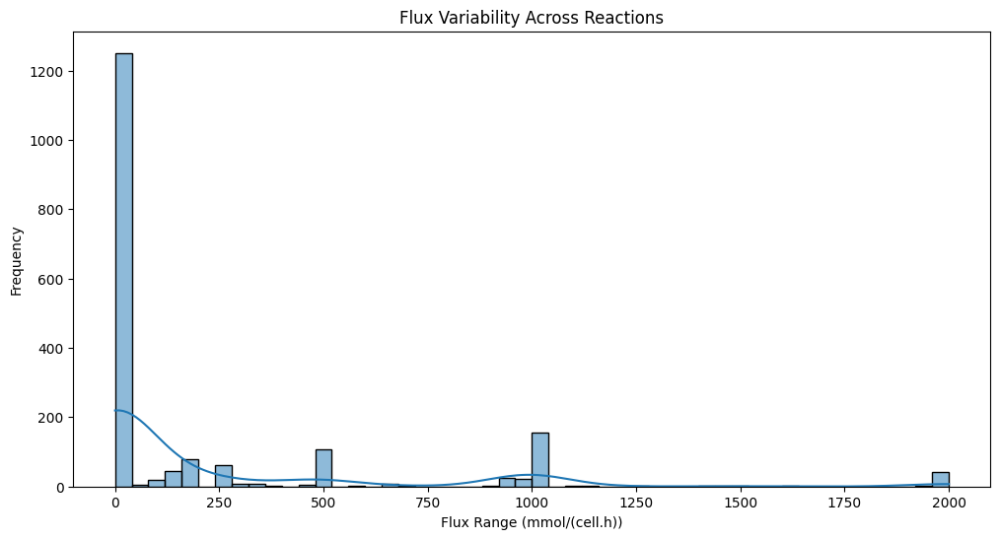

Bottleneck Reactions:
 ['ANTPPT', 'ATNS', 'TRANS-RXNTFS-55-CPD-125752', 'TRANS-RXNTFS-55-DTDP-D-GLUCOSE3', 'TRANS-RXNTFS-55-ADP-D-GLUCOSE4', 'TRANS-RXNTFS-55-UDP-ACETYL-CARBOXYVINYL-GLUCOSAMINE5', 'TRANS-RXNTFS-55-UDP-N-ACETYLMURAMATE6', 'TRANS-RXNTFS-55-UDP-GLUCURONATE7', 'TRANS-RXNTFS-55-UDP-D-GALACTO-14-FURANOSE8', 'TRANS-RXNTFS-55-UDP-D-GALACTURONATE10', 'TRANS-RXNTFS-55-UDP-D-XYLOSE11', 'TRANS-RXNTFS-55-UDP-N-ACETYL-D-GLUCOSAMINE12', 'TRANS-RXNTFS-55-CPD-900713', 'TRANS-RXNTFS-55-ADENOSINE_DIPHOSPHATE_RIBOSE14', 'TRANS-RXNTFS-55-CPD-1079415', 'TRANS-RXNTFS-55-CPD-1488016', 'TRANS-RXNTFS-55-DTDP-DEOH-DEOXY-GLUCOSE18', 'IMPC', 'QUILSYN', 'RXN-1603', 'TRANS-RXN-245-ALPHA-MALTOSE22', 'LANOSTEROL-SYNTHASE-RXN', 'RXN-14779', 'TRANS-RXNTFS-57', 'RXN-14778', 'RXN-14777', 'RXN-14790', 'TRANS-RXNTFS-58-ALLANTOATE29', 'TRANS-RXNTFS-58-CPD-1270930', 'TRANS-RXNTFS-58-GLUCONATE31', 'TRANS-RXNTFS-58-CPD-1244332', 'TRANS-RXNTFS-58-CARNITINE33', 'TRANS-RXNTFS-58-ACET34', 'TRANS-RXNTFS-58-OROTATE35

In [82]:
# Load FVA results
fva_results = pd.read_csv("fva_results.csv", index_col=0)

# Identify bottleneck reactions (low variability)
bottleneck_reactions = fva_results[fva_results["range"] < 1]

# Identify high-variability reactions (wide flux range)
wide_range_reactions = fva_results[fva_results["range"] > 10]

# Plot flux variability
plt.figure(figsize=(12, 6))
sns.histplot(fva_results["range"], bins=50, kde=True)
plt.xlabel("Flux Range (mmol/(cell.h))")
plt.ylabel("Frequency")
plt.title("Flux Variability Across Reactions")
plt.show()

# Save bottleneck and highly variable reactions
bottleneck_reactions.to_csv("bottleneck_reactions.csv")
wide_range_reactions.to_csv("wide_range_reactions.csv")

print("Bottleneck Reactions:\n", bottleneck_reactions.index.tolist())
print("\nHighly Variable Reactions:\n", wide_range_reactions.index.tolist())


## Flux Sampling

     ANTPPT      ATNS  TRANS-RXNTFS-55-CPD-125752  \
0  0.000013  0.000013                         0.0   
1  0.000266  0.000266                         0.0   
2  0.000270  0.000270                         0.0   
3  0.012956  0.012956                         0.0   
4  0.019815  0.019815                         0.0   

   TRANS-RXNTFS-55-DTDP-D-GLUCOSE3  TRANS-RXNTFS-55-ADP-D-GLUCOSE4  \
0                              0.0                             0.0   
1                              0.0                             0.0   
2                              0.0                             0.0   
3                              0.0                             0.0   
4                              0.0                             0.0   

   TRANS-RXNTFS-55-UDP-ACETYL-CARBOXYVINYL-GLUCOSAMINE5  \
0                                                0.0      
1                                                0.0      
2                                                0.0      
3                       

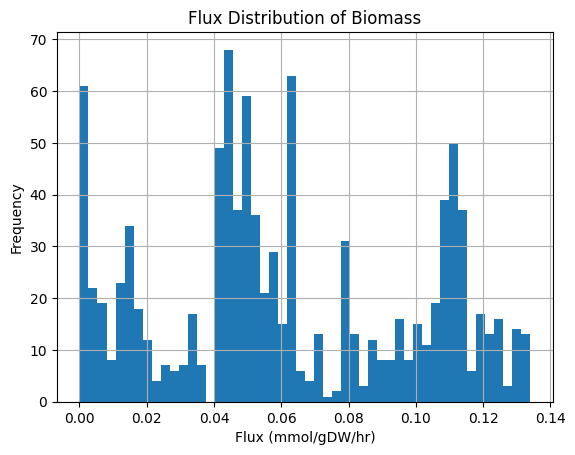

In [210]:
from cobra.sampling import sample
samples = sample(model, 1000)
model.objective= 'Putative_Itaconate_Transporter'
solution= model.optimize()
# View first few samples
print(samples.head())
 
# Check the distribution of a specific reaction flux (e.g., NADPH regeneration)
import matplotlib.pyplot as plt
samples['Putative_Itaconate_Transporter'].hist(bins=50)
plt.xlabel("Flux (mmol/gDW/hr)")
plt.ylabel("Frequency")
plt.title("Flux Distribution of Biomass")
plt.show()

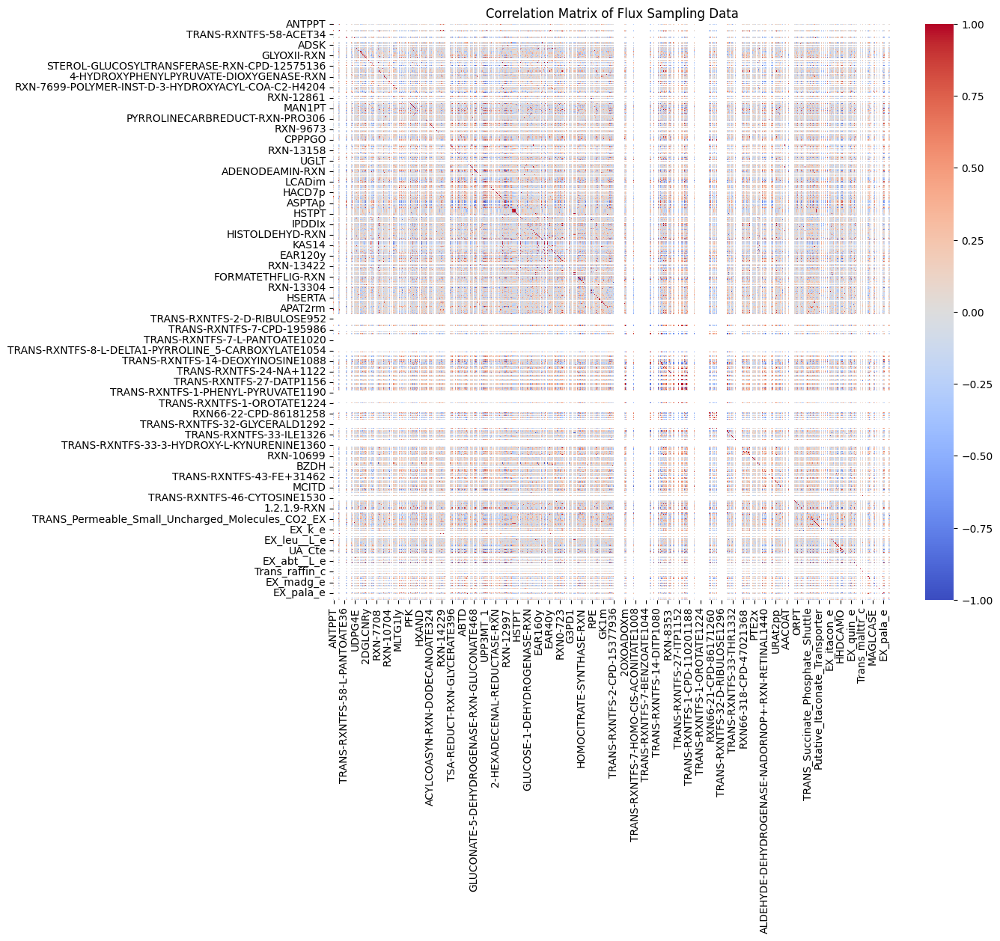

Correlation matrix saved as 'correlation_matrix.csv'


In [83]:


# Compute correlation matrix
correlation_matrix = samples.corr()

# Plot heatmap for visualization
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, cmap="coolwarm", center=0)
plt.title("Correlation Matrix of Flux Sampling Data")
plt.show()

# Save correlation matrix
correlation_matrix.to_csv("correlation_matrix.csv")

print("Correlation matrix saved as 'correlation_matrix.csv'")


In [352]:
!pip install adjustText

Defaulting to user installation because normal site-packages is not writeable
  Using cached adjustText-1.3.0-py3-none-any.whl.metadata (3.1 kB)
Using cached adjustText-1.3.0-py3-none-any.whl (13 kB)



[notice] A new release of pip is available: 25.0.1 -> 25.1.1
[notice] To update, run: C:\Users\Anand\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


In [389]:
import pandas as pd
import numpy as np
from cobra.sampling import sample
import matplotlib.pyplot as plt
from adjustText import adjust_text
import seaborn as sns

# Reactions of interest
biomass_rxn = 'BIOMASS_REACTION'
itaconate_rxn = 'Putative_Itaconate_Transporter'

# -------------------- CONFIG --------------------
bootstrap_runs = 5  # number of sampling replicates per KO
samples_per_run = 400
seeds = [10, 20, 30, 40, 50]  # length should match bootstrap_runs
assert len(seeds) == bootstrap_runs

# -------------------- STEP 1: WT Sampling --------------------
wt_results = []
for seed in seeds:
    s = sample(model, samples_per_run, seed=seed)
    s['Gene'] = 'WT'
    wt_results.append(s)

samples_wt_all = pd.concat(wt_results, ignore_index=True)
samples_wt_all = samples_wt_all[[biomass_rxn, itaconate_rxn, 'Gene']]
samples_wt_all.columns = ['Biomass', 'Itaconate', 'Gene']

# WT centroid (mean across all samples)
wt_centroid = samples_wt_all[['Biomass', 'Itaconate']].mean().values

# -------------------- STEP 2: KO Bootstrapped Sampling --------------------
ko_centroids = []
all_samples = [samples_wt_all]

for i, row in df_filtered.iterrows():
    ko_gene = row['Gene Knocked Out']
    centroid_list = []

    for seed in seeds:
        with model:
            model.genes.get_by_id(ko_gene).knock_out()
            s = sample(model, samples_per_run, seed=seed)
            s['Gene'] = ko_gene
            centroid = s[[biomass_rxn, itaconate_rxn]].mean().values
            centroid_list.append(centroid)
            s = s[[biomass_rxn, itaconate_rxn, 'Gene']]
            s.columns = ['Biomass', 'Itaconate', 'Gene']
            all_samples.append(s)

    centroid_arr = np.array(centroid_list)
    centroid_mean = centroid_arr.mean(axis=0)
    centroid_std = centroid_arr.std(axis=0)
    ko_centroids.append({
        'Gene': ko_gene,
        'Mean_Biomass': centroid_mean[0],
        'Mean_Itaconate': centroid_mean[1],
        'Std_Biomass': centroid_std[0],
        'Std_Itaconate': centroid_std[1],
        'BetterThanWT': (centroid_mean[0] > wt_centroid[0]) and (centroid_mean[1] > wt_centroid[1])
    })

# -------------------- STEP 3: Combine Samples + Centroid Table --------------------
samples_all = pd.concat(all_samples, ignore_index=True)
centroids_df = pd.DataFrame(ko_centroids)
top_centroids = centroids_df[centroids_df['BetterThanWT']].sort_values(
    by=['Mean_Itaconate', 'Mean_Biomass'], ascending=False).head(10)


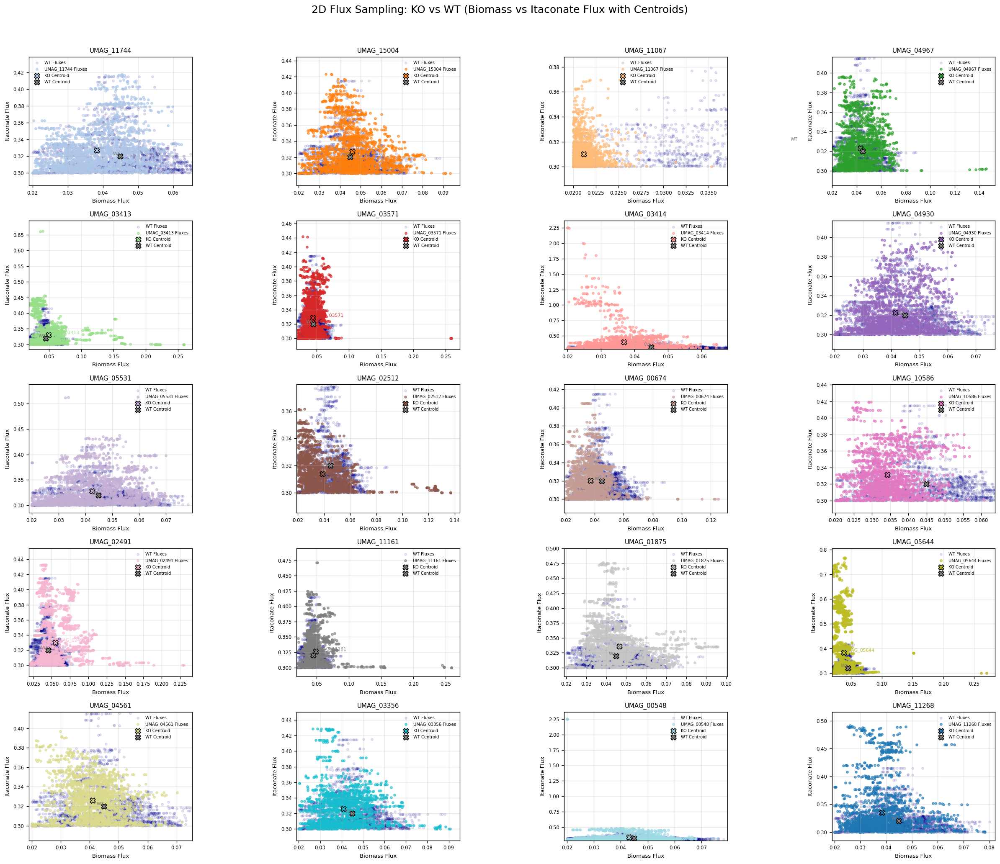

In [397]:
import matplotlib.pyplot as plt
import numpy as np

# Recalculate WT centroid once
wt_centroid = samples_all[samples_all['Gene'] == 'WT'][['Biomass', 'Itaconate']].mean()

# Create subplots
genes = [g for g in samples_all['Gene'].unique() if g != 'WT']
ncols = 4
nrows = int(np.ceil(len(genes) / ncols))

fig, axes = plt.subplots(nrows, ncols, figsize=(20, 3.5 * nrows), dpi=120)
axes = axes.flatten()

for i, gene in enumerate(genes):
    ax = axes[i]

    # Subsets
    ko_data = samples_all[samples_all['Gene'] == gene]
    wt_data = samples_all[samples_all['Gene'] == 'WT']

    # Plot WT samples (faded gray)
    ax.scatter(wt_data['Biomass'], wt_data['Itaconate'], s=10, alpha=0.1, color=color_map['WT'], label='WT Fluxes')

    # Plot KO samples
    ax.scatter(ko_data['Biomass'], ko_data['Itaconate'], s=10, alpha=0.6, color=color_map[gene], label=f'{gene} Fluxes')

    # KO Centroid
    c = centroids[centroids['Gene'] == gene].iloc[0]
    ax.scatter(c['Mean_Biomass'], c['Mean_Itaconate'], marker='X', s=60,
               color=color_map[gene], edgecolor='black', label='KO Centroid')
    ax.text(c['Mean_Biomass'], c['Mean_Itaconate'], gene, fontsize=6.5,
            ha='left', va='bottom', color=color_map[gene])

    # WT Centroid
    ax.scatter(wt_centroid['Biomass'], wt_centroid['Itaconate'], marker='X', s=60,
               color='gray', edgecolor='black', label='WT Centroid')
    ax.text(wt_centroid['Biomass'], wt_centroid['Itaconate'], 'WT', fontsize=6.5,
            ha='right', va='bottom', color='gray')

    ax.set_title(gene, fontsize=9)
    ax.set_xlabel("Biomass Flux", fontsize=8)
    ax.set_ylabel("Itaconate Flux", fontsize=8)
    ax.tick_params(labelsize=7)
    ax.grid(alpha=0.3)
    ax.set_facecolor('white')

    # Auto scale to KO range with buffer
    buffer = 0.05
    x_min, x_max = ko_data['Biomass'].min(), ko_data['Biomass'].max()
    y_min, y_max = ko_data['Itaconate'].min(), ko_data['Itaconate'].max()
    ax.set_xlim(x_min - abs(x_min) * buffer, x_max + abs(x_max) * buffer)
    ax.set_ylim(y_min - abs(y_min) * buffer, y_max + abs(y_max) * buffer)

    # Legend
    ax.legend(fontsize=6, loc='best', frameon=False)

# Remove empty subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

fig.suptitle("2D Flux Sampling: KO vs WT (Biomass vs Itaconate Flux with Centroids)", fontsize=15)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


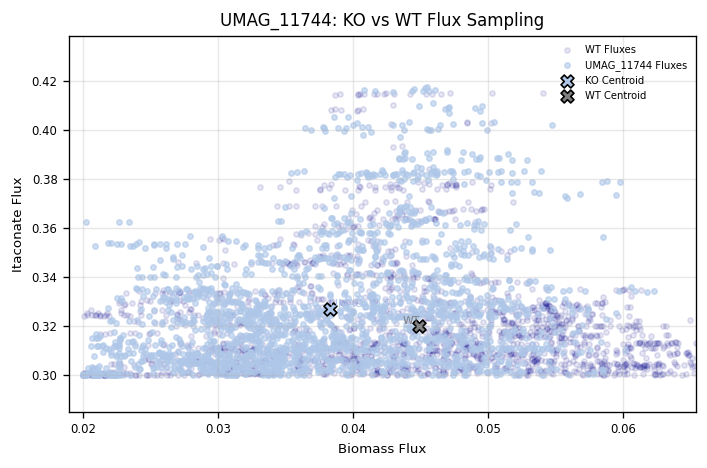

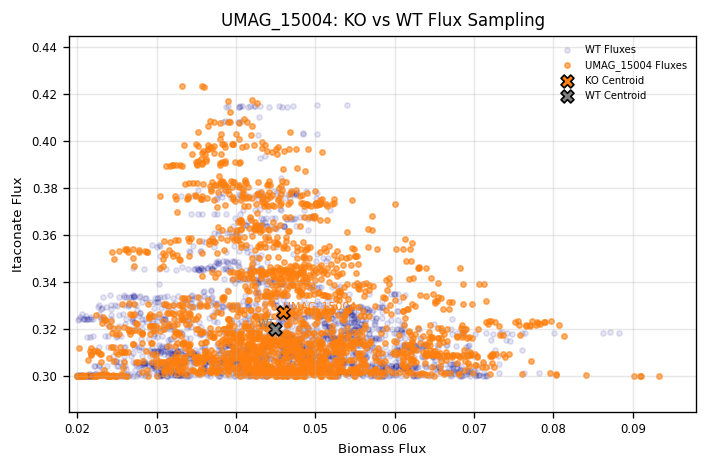

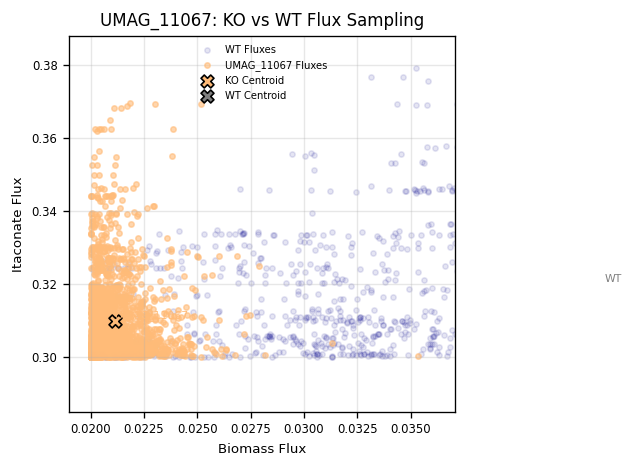

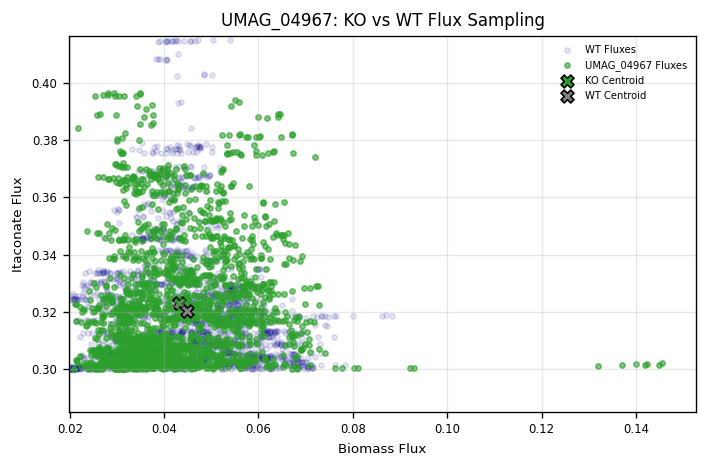

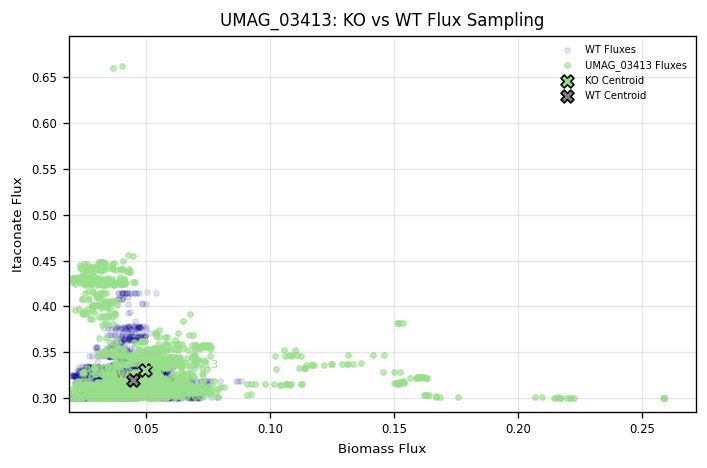

...

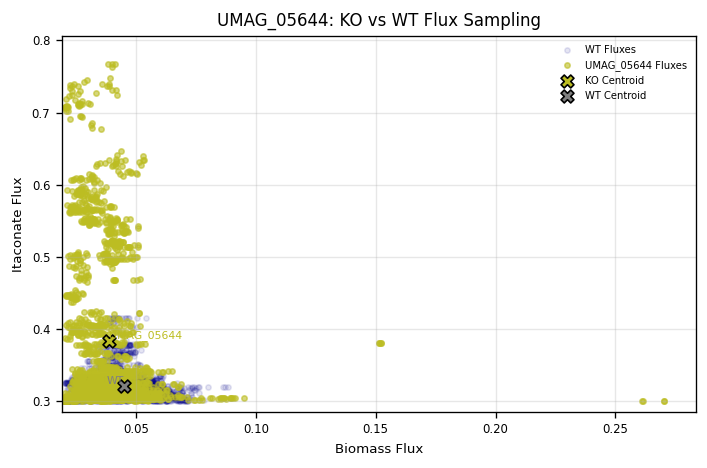

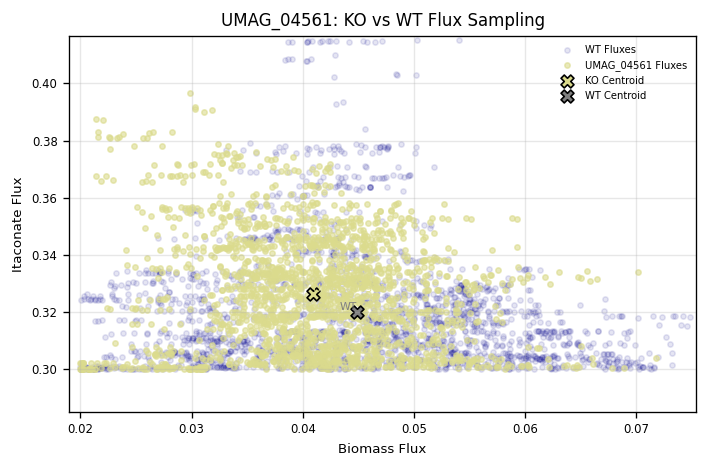

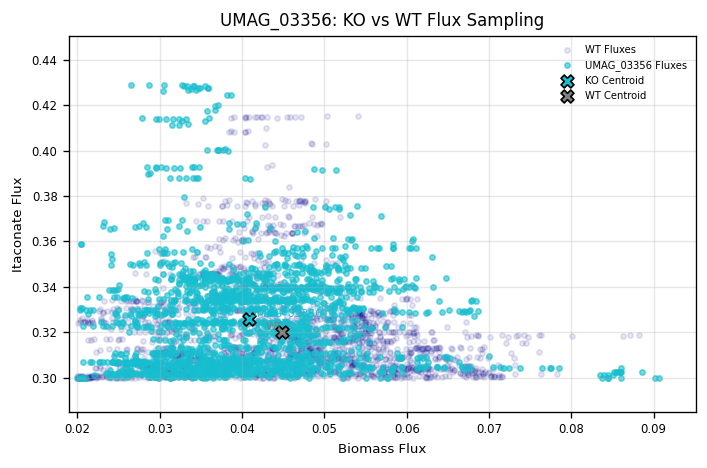

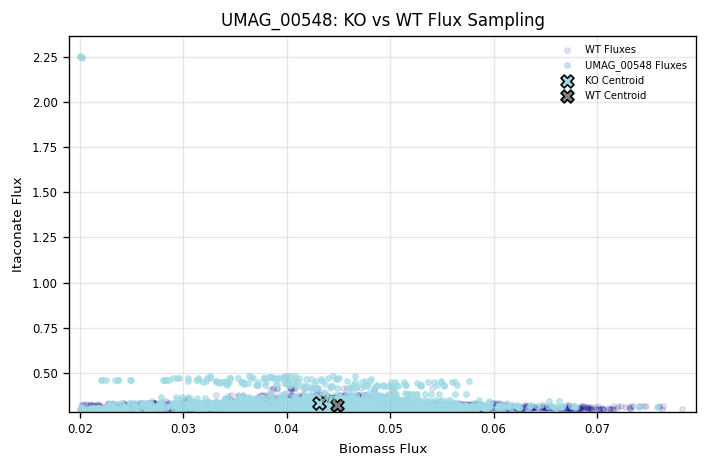

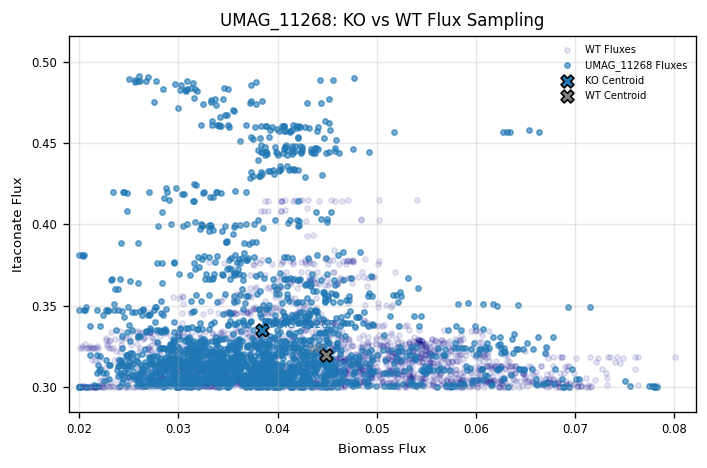

In [459]:
import matplotlib.pyplot as plt
import numpy as np

# Recalculate WT centroid once
wt_centroid = samples_all[samples_all['Gene'] == 'WT'][['Biomass', 'Itaconate']].mean()

# Get all KO genes
genes = [g for g in samples_all['Gene'].unique() if g != 'WT']

for gene in genes:
    plt.figure(figsize=(6, 4), dpi=120)

    # Subsets
    ko_data = samples_all[samples_all['Gene'] == gene]
    wt_data = samples_all[samples_all['Gene'] == 'WT']

    # Plot WT samples (faded gray)
    plt.scatter(wt_data['Biomass'], wt_data['Itaconate'], s=10, alpha=0.1, 
                color=color_map['WT'], label='WT Fluxes')

    # Plot KO samples
    plt.scatter(ko_data['Biomass'], ko_data['Itaconate'], s=10, alpha=0.6, 
                color=color_map[gene], label=f'{gene} Fluxes')

    # KO Centroid
    c = centroids[centroids['Gene'] == gene].iloc[0]
    plt.scatter(c['Mean_Biomass'], c['Mean_Itaconate'], marker='X', s=60,
                color=color_map[gene], edgecolor='black', label='KO Centroid')
    plt.text(c['Mean_Biomass'], c['Mean_Itaconate'], gene, fontsize=6.5,
             ha='left', va='bottom', color=color_map[gene])

    # WT Centroid
    plt.scatter(wt_centroid['Biomass'], wt_centroid['Itaconate'], marker='X', s=60,
                color='gray', edgecolor='black', label='WT Centroid')
    plt.text(wt_centroid['Biomass'], wt_centroid['Itaconate'], 'WT', fontsize=6.5,
             ha='right', va='bottom', color='gray')

    # Formatting
    plt.title(f"{gene}: KO vs WT Flux Sampling", fontsize=10)
    plt.xlabel("Biomass Flux", fontsize=8)
    plt.ylabel("Itaconate Flux", fontsize=8)
    plt.tick_params(labelsize=7)
    plt.grid(alpha=0.3)
    plt.gca().set_facecolor('white')

    # Auto scale to KO range with buffer
    buffer = 0.05
    x_min, x_max = ko_data['Biomass'].min(), ko_data['Biomass'].max()
    y_min, y_max = ko_data['Itaconate'].min(), ko_data['Itaconate'].max()
    plt.xlim(x_min - abs(x_min) * buffer, x_max + abs(x_max) * buffer)
    plt.ylim(y_min - abs(y_min) * buffer, y_max + abs(y_max) * buffer)

    # Legend
    plt.legend(fontsize=6, loc='best', frameon=False)

    plt.tight_layout()
    plt.show()


## FSEOF

In [407]:
def run_fseof(model, biomass_rxn_id, product_rxn_id, steps=20, top_n=150):
    model = model.copy()
    product_rxn = model.reactions.get_by_id(product_rxn_id)
    biomass_rxn = model.reactions.get_by_id(biomass_rxn_id)

    model.objective = product_rxn
    max_prod = model.slim_optimize()

    prod_vals = np.linspace(0, max_prod * 0.9, steps)
    flux_data = []

    for val in prod_vals:
        with model:
            product_rxn.lower_bound = val
            product_rxn.upper_bound = val
            solution = model.optimize()
            if solution.status == 'optimal':
                flux_data.append(solution.fluxes)
            else:
                flux_data.append(pd.Series([np.nan]*len(model.reactions), index=model.reactions.list_attr("id")))

    flux_df = pd.DataFrame(flux_data, index=np.round(prod_vals, 3))
    flux_change = flux_df.diff().abs().sum().dropna()  
    top_rxns = flux_change.sort_values(ascending=False).head(top_n).index.tolist()

    return flux_df, flux_change, top_rxns


In [319]:
def combine_flux_changes(flux_change_prod, flux_change_biomass, top_n=100, method='sum'):
    common_rxns = flux_change_prod.index.intersection(flux_change_biomass.index)

    if method == 'sum':
        combined_score = flux_change_prod[common_rxns] + flux_change_biomass[common_rxns]
    elif method == 'euclidean':
        combined_score = (flux_change_prod[common_rxns]**2 + flux_change_biomass[common_rxns]**2)**0.5
    elif method == 'product':
        combined_score = flux_change_prod[common_rxns] * flux_change_biomass[common_rxns]
    else:
        raise ValueError("Unsupported method.")

    top_combined_rxns = combined_score.sort_values(ascending=False).head(top_n).index.tolist()
    return combined_score, top_combined_rxns


In [429]:
def plot_fseof_trends(flux_df, top_rxns):
    top20 = top_rxns[:15]
    flux_df[top20].abs().plot(figsize=(12, 6), lw=2)  # abs() to preserve directionality fix
    plt.xlabel("Product Flux")
    plt.ylabel("Reaction Flux (abs)")
    plt.title("FSEOF Trends (Top 15 Reactions)")
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()


In [411]:
def plot_3d_from_fseof(flux_df_prod, flux_df_biomass, top_rxns):
    prod_vals = flux_df_prod.index.values
    biomass_vals = flux_df_biomass.index.values
    X, Y = np.meshgrid(prod_vals, biomass_vals)

    for rxn in top_rxns:
        try:
            Z_prod = flux_df_prod[rxn].values
            Z_biomass = flux_df_biomass[rxn].values
            Z = np.outer(Z_prod, Z_biomass)  # Approximate interaction

            fig = plt.figure(figsize=(8, 6))
            ax = fig.add_subplot(111, projection='3d')
            ax.plot_surface(X, Y, Z, cmap='plasma')
            ax.set_title(f"3D Flux Interaction Surface: {rxn}")
            ax.set_xlabel("Product Flux")
            ax.set_ylabel("Biomass Flux")
            ax.set_zlabel("Reaction Flux (approx)")
            plt.tight_layout()
            plt.show()
        except KeyError:
            print(f"{rxn} not found in flux_df. Skipping.")


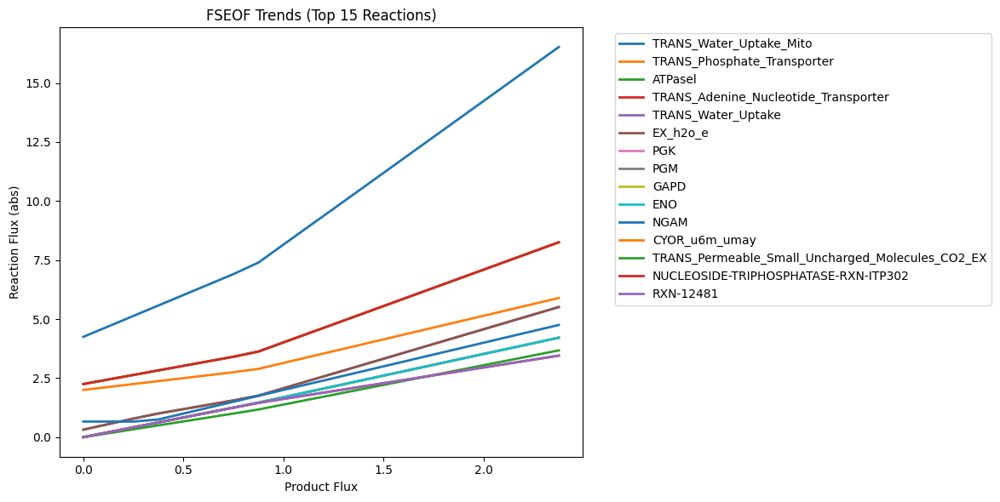

In [439]:


# === STEP 1: Run FSEOF ===
flux_df_prod, flux_change_prod, top_rxns = run_fseof(model, biomass_id, itaconate_id)

# === STEP 2: Plot 1D FSEOF Trends ===
plot_fseof_trends(flux_df_prod, top_rxns)




In [441]:
flux_df_biomass, flux_change_biomass, top_rxns = run_fseof(model, itaconate_id, biomass_id)

In [442]:
combined_scores, top_rxns_combined = combine_flux_changes(flux_change_prod, flux_change_biomass, method='euclidean')


In [447]:
print(top_rxns_combined [0:20])

['TRANS_Water_Uptake_Mito', 'TRANS_Adenine_Nucleotide_Transporter', 'TRANS_Phosphate_Transporter', 'ATPasel', 'EX_pi_e', 'PItx', 'CYOR_u6m_umay', 'PGK', 'GAPD', 'TRANS_Water_Uptake', 'EX_h2o_e', 'PGM', 'ENO', 'TRANS_Permeable_Small_Uncharged_Molecules_CO2_EX', 'PYK', 'CO2tex', 'EX_co2_e', 'NAD_umay', 'TRANS_Permeable_Small_Uncharged_Molecules_OXYGEN_UPTAKE', 'EX_o2_e']


In [453]:
import pandas as pd
from cobra.io import read_sbml_model  # or use load_json_model depending on your model format

# List of reactions you're interested in
reaction_ids = [
    'TRANS_Water_Uptake_Mito', 'TRANS_Adenine_Nucleotide_Transporter', 'TRANS_Phosphate_Transporter',
    'ATPasel', 'EX_pi_e', 'PItx', 'CYOR_u6m_umay', 'PGK', 'GAPD', 'TRANS_Water_Uptake',
    'EX_h2o_e', 'PGM', 'ENO', 'TRANS_Permeable_Small_Uncharged_Molecules_CO2_EX',
    'PYK', 'CO2tex', 'EX_co2_e', 'NAD_umay',
    'TRANS_Permeable_Small_Uncharged_Molecules_OXYGEN_UPTAKE', 'EX_o2_e'
]

# Prepare data for the table
reaction_data = []

for rxn_id in reaction_ids:
    reaction = model.reactions.get_by_id(rxn_id)
    rxn_equation = reaction.reaction
    genes = [g.id for g in reaction.genes]
    reaction_data.append({
        'Reaction ID': rxn_id,
        'Reaction Equation': rxn_equation,
        'Associated Genes': ", ".join(genes) if genes else "None"
    })

# Create and display the DataFrame
reaction_df = pd.DataFrame(reaction_data)
print(reaction_df.to_string(index=False))
reaction_df.to_csv('reactions_oe.csv')


                                            Reaction ID                                                 Reaction Equation                                                                                                                                                                                                                                                                   Associated Genes
                                TRANS_Water_Uptake_Mito                                                   h2o_c <=> h2o_m                                                                                                                                                                                                                                                                               None
                   TRANS_Adenine_Nucleotide_Transporter                                   adp_c + atp_m --> adp_m + atp_c                                                                                     

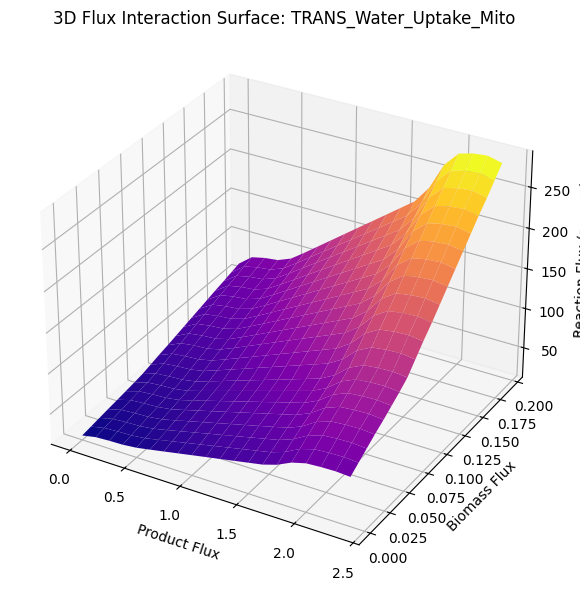

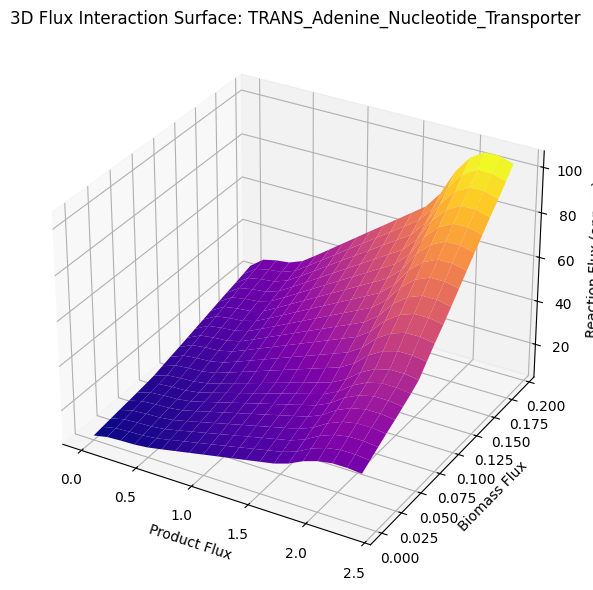

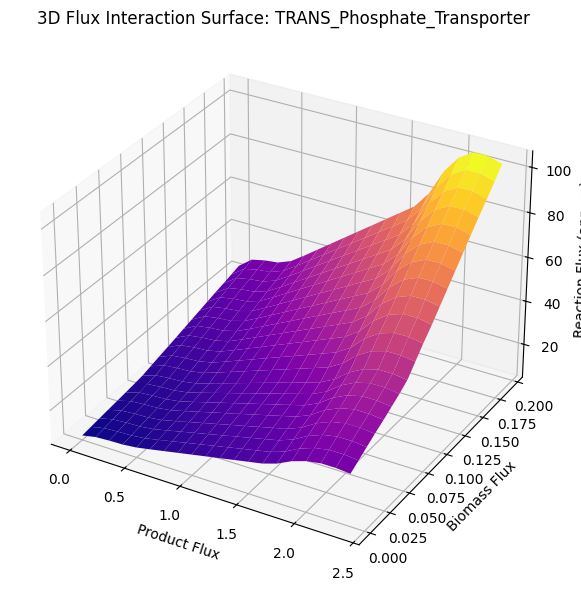

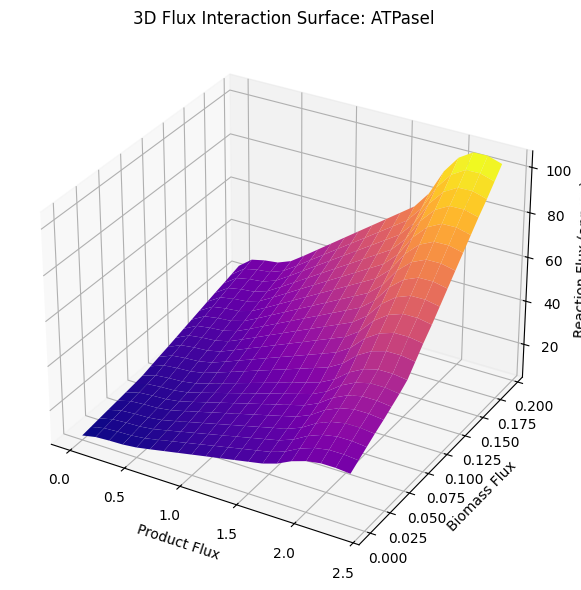

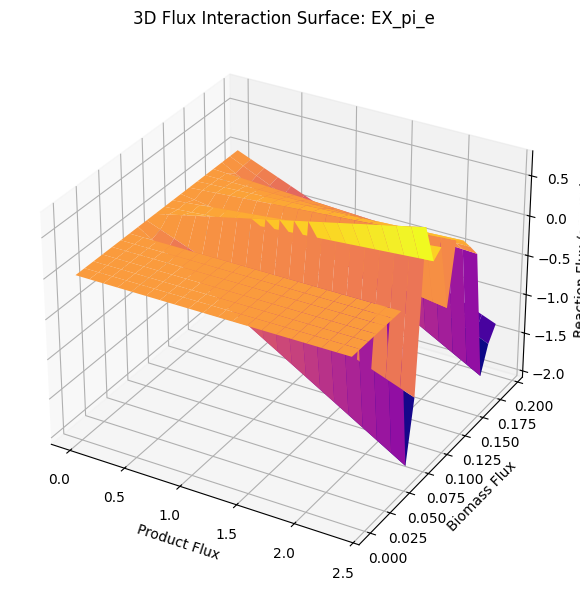

...

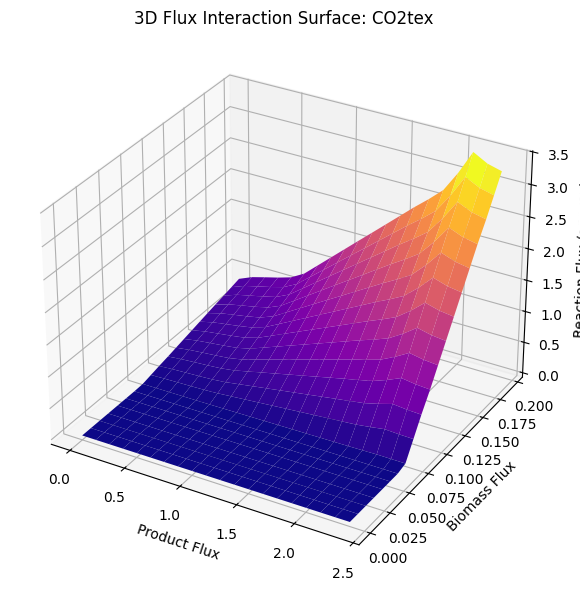

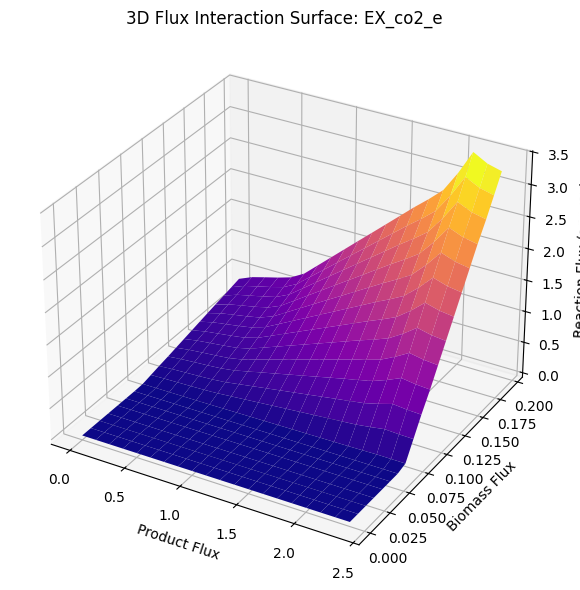

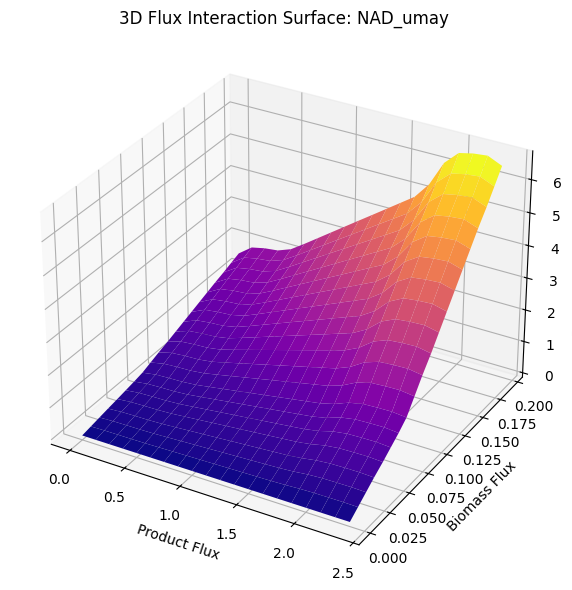

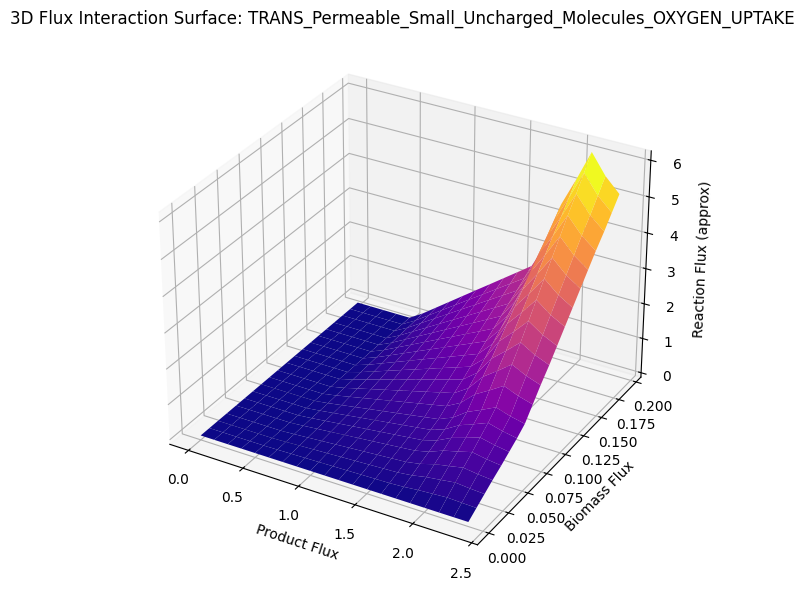

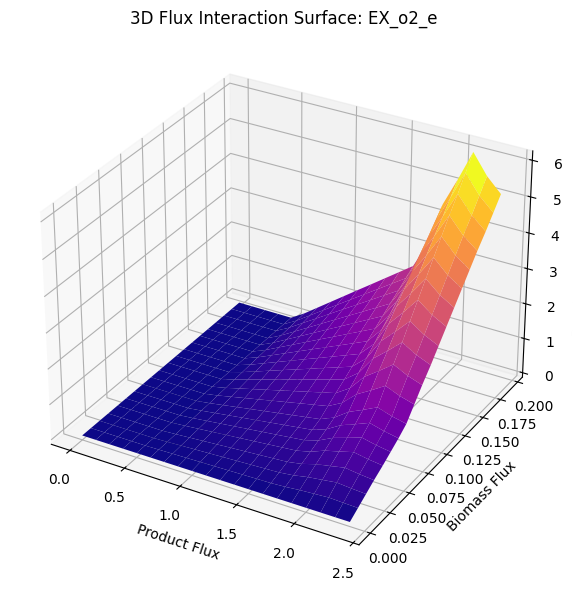

In [443]:
plot_3d_from_fseof(flux_df_prod, flux_df_biomass, top_rxns_combined[:20])

In [444]:
import numpy as np
import pandas as pd
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # Needed for 3D plotting

def run_2d_fseof(model, biomass_rxn_id, product_rxn_id, target_rxns, product_steps=10, biomass_steps=10, max_flux_margin=0.95):
    model = model.copy()
    product_rxn = model.reactions.get_by_id(product_rxn_id)
    biomass_rxn = model.reactions.get_by_id(biomass_rxn_id)

    # Step 1: Get max product and biomass fluxes
    model.objective = product_rxn
    max_prod = model.slim_optimize()
    model.objective = biomass_rxn
    max_biomass = model.slim_optimize()

    if max_prod is None or max_biomass is None or max_prod <= 0 or max_biomass <= 0:
        raise ValueError("Model optimization failed: ensure biomass and product fluxes are feasible and > 0.")

    # Step 2: Create safe product and biomass ranges
    prod_vals = np.round(np.linspace(0.1, max_flux_margin, product_steps) * max_prod, 4)
    biomass_vals = np.round(np.linspace(0.1, max_flux_margin, biomass_steps) * max_biomass, 4)

    flux_records = []
    index_vals = []

    for p in tqdm(prod_vals, desc="Product Flux Grid"):
        for b in biomass_vals:
            with model:
                # Apply bounds only if feasible
                product_rxn.lower_bound = p
                product_rxn.upper_bound = p
                biomass_rxn.lower_bound = b
                biomass_rxn.upper_bound = b

                try:
                    sol = model.optimize()
                    if sol.status == 'optimal':
                        flux_subset = sol.fluxes[target_rxns]
                    else:
                        flux_subset = pd.Series([np.nan] * len(target_rxns), index=target_rxns)
                except:
                    flux_subset = pd.Series([np.nan] * len(target_rxns), index=target_rxns)

                flux_records.append(flux_subset)
                index_vals.append((p, b))

    # Step 3: Construct MultiIndex DataFrame
    flux_df = pd.DataFrame(flux_records, index=pd.MultiIndex.from_tuples(index_vals, names=["ProductFlux", "BiomassFlux"]))
    flux_df = flux_df.dropna(how='all')  # Drop all-infeasible points

    # Step 4: Gradient analysis on reaction flux surfaces
    if flux_df.shape[0] < 5:
        raise ValueError("Too few feasible points to analyze gradients.")

    gradients = {}
    for rxn in flux_df.columns:
        grid = flux_df[rxn].unstack(level=1)  # shape: product x biomass
        grad_x = grid.diff(axis=0)
        grad_y = grid.diff(axis=1)
        gradients[rxn] = (grad_x.abs() + grad_y.abs()).mean().mean()

    grad_series = pd.Series(gradients)
    top_rxns = grad_series.sort_values(ascending=False).head(10).index.tolist()

    return flux_df, biomass_vals, prod_vals, top_rxns


In [445]:
def plot_3d_surfaces_top10(flux_df_2d, top_rxns):
    product_vals = sorted(flux_df_2d.index.get_level_values(0).unique())
    biomass_vals = sorted(flux_df_2d.index.get_level_values(1).unique())
    X, Y = np.meshgrid(product_vals, biomass_vals)

    for rxn_id in top_rxns[:20]:
        try:
            Z = flux_df_2d[rxn_id].unstack(level=1).values  # Reaction flux values
            if np.isnan(Z).all():
                print(f"Skipping {rxn_id}: all NaNs")
                continue

            fig = plt.figure(figsize=(8, 6))
            ax = fig.add_subplot(111, projection='3d')
            ax.plot_surface(X, Y, Z.T, cmap='viridis')
            ax.set_title(f"3D Flux Surface: {rxn_id}")
            ax.set_xlabel("Product Flux")
            ax.set_ylabel("Biomass Flux")
            ax.set_zlabel("Reaction Flux")
            plt.tight_layout()
            plt.show()
        except KeyError:
            print(f"Warning: {rxn_id} data not found in flux_df_2d and will be skipped.")


Product Flux Grid:   0%|          | 0/10 [00:00<?, ?it/s]

C:\Users\Anand\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\cobra\util\solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)
C:\Users\Anand\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\cobra\util\solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)
C:\Users\Anand\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\cobra\util\solver.py:554: UserWarning: Solver status is 'infeasible'.
  warn(f"Solver status is '{status}'.", UserWarning)
C:\Users\Anand\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\cobra\util\solver.py:554: UserWarning: Solver status is 'infeasible'.
  war

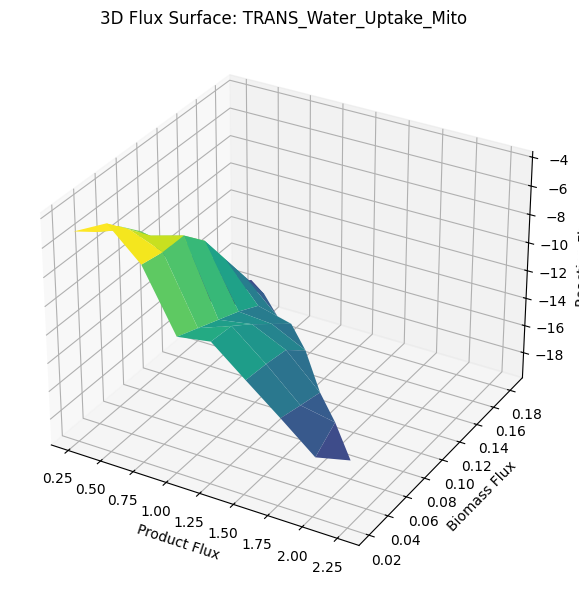

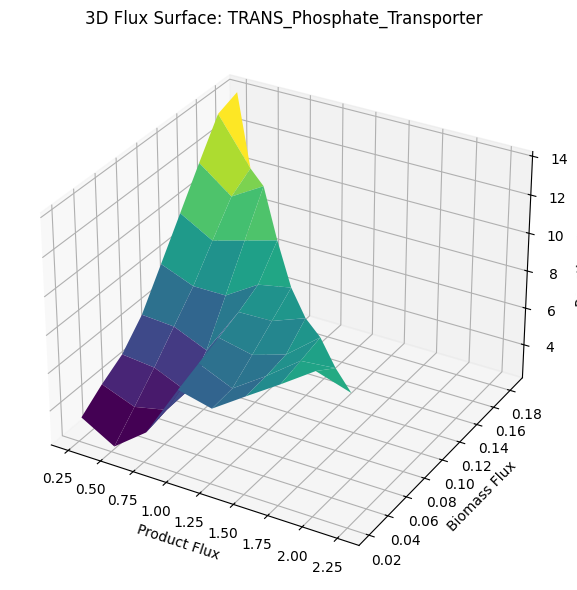

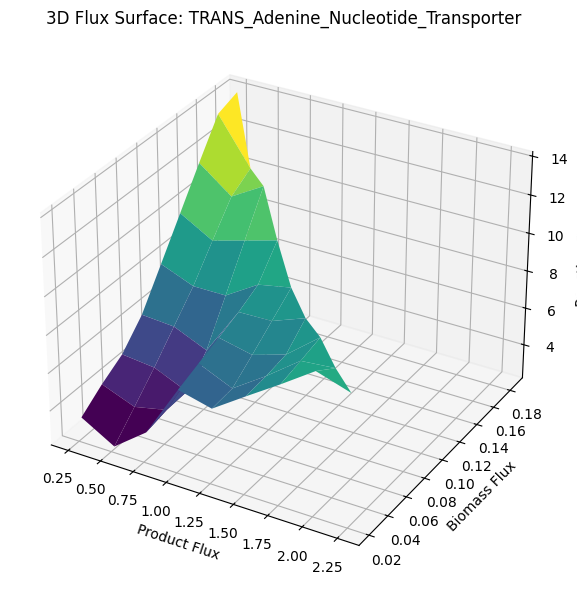

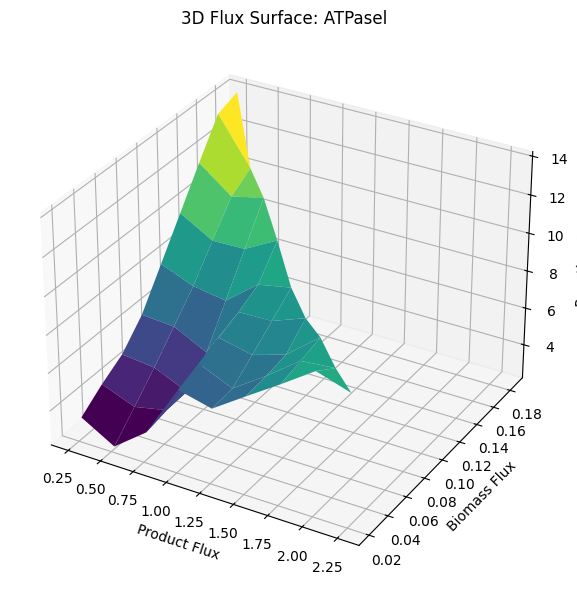

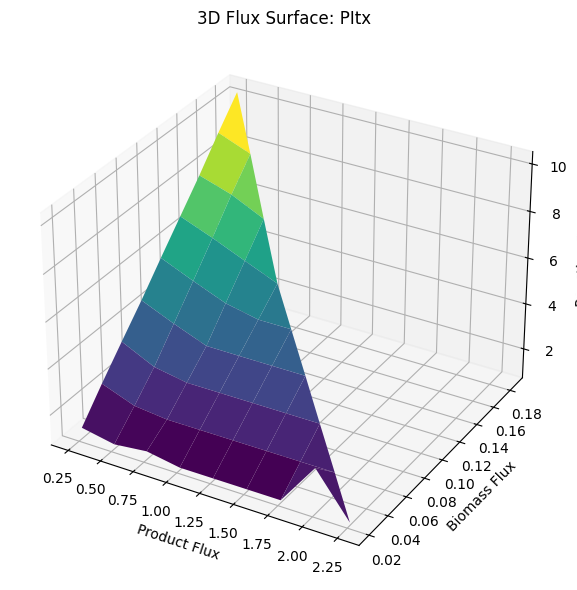

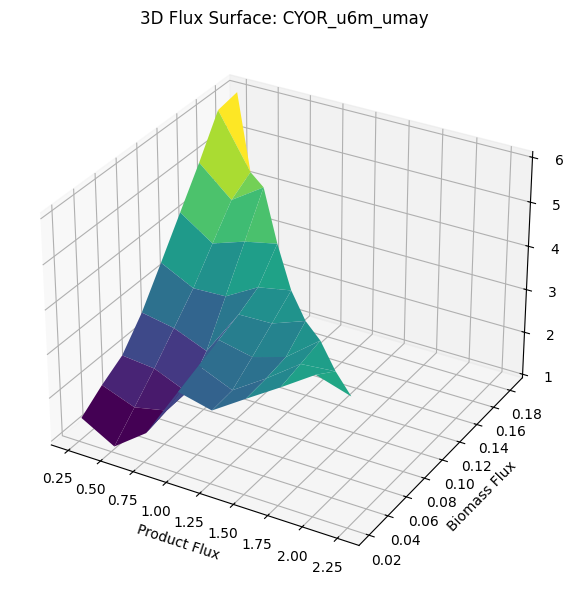

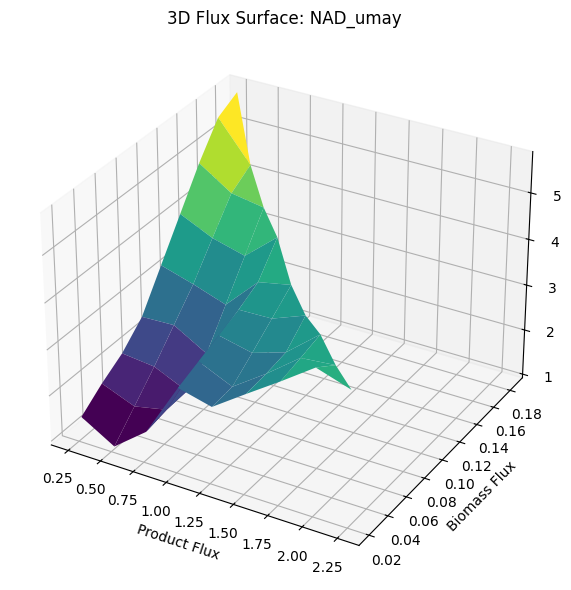

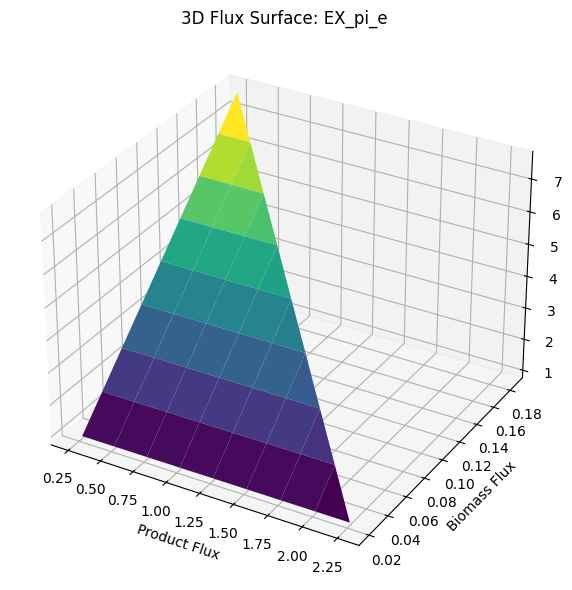

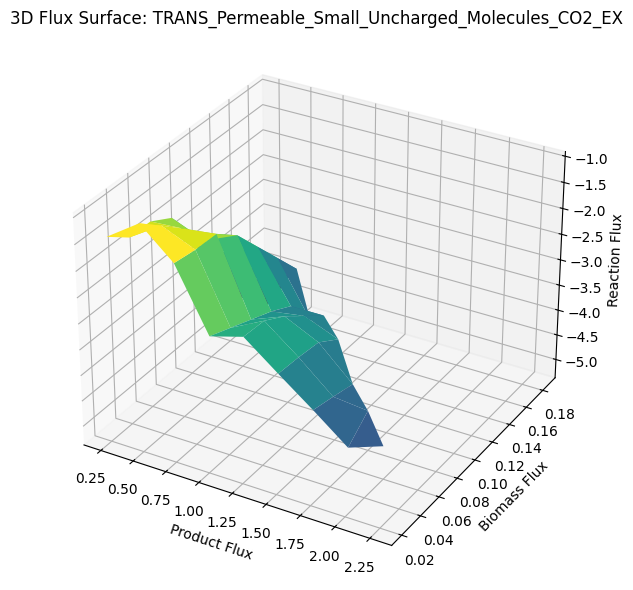

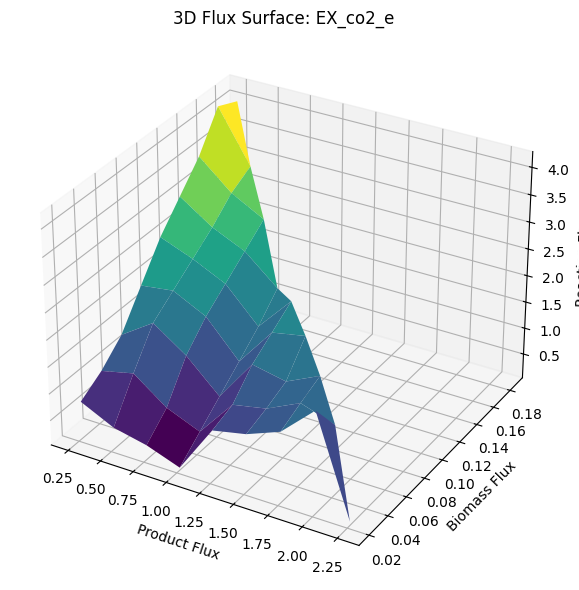

In [446]:
flux_df_2d, biomass_vals, prod_vals, top_rxns_2d = run_2d_fseof(
    model, biomass_id, itaconate_id, top_rxns[:100],
    product_steps=10, biomass_steps=10
)

plot_3d_surfaces_top10(flux_df_2d, top_rxns_2d)

In [282]:
!pip freeze


about-time==4.2.1
alabaster==1.0.0
alive-progress==3.2.0
annotated-types==0.7.0
anyio==4.4.0
appdirs==1.4.4
argon2-cffi==23.1.0
argon2-cffi-bindings==21.2.0
arrow==1.3.0
asttokens==2.4.1
atomicwrites==1.4.1
attrs==24.2.0
autograd==1.7.0
babel==2.16.0
beautifulsoup4==4.12.3
binaryornot==0.4.4
bleach==6.1.0
blessings==1.7
cameo==0.13.6
carveme==1.6.2
certifi==2024.8.30
cffi==1.17.1
chardet==5.2.0
charset-normalizer==3.4.1
click==8.1.8
click-configfile==0.2.3
click-log==0.4.0
cma==3.2.2
cobra==0.29.0
colorama==0.4.6
comm==0.2.2
configparser==7.1.0
contourpy==1.3.0
cookiecutter==2.6.0
cryptography==44.0.0
cycler==0.12.1
debugpy==1.8.5
decorator==5.1.1
defusedxml==0.7.1
depinfo==2.2.0
Deprecated==1.2.15
dill==0.3.9
diskcache==5.6.3
docutils==0.21.2
entrypoints==0.4
Escher==1.7.3
et_xmlfile==2.0.0
executing==2.1.0
fastjsonschema==2.20.0
fonttools==4.54.1
future==1.0.0
gitdb==4.0.12
GitPython==3.1.44
gnomic==1.0.1
grako==3.18.1
grapheme==0.6.0
graphviz==0.20.3
greenlet==3.1.1
gurobipy==12.0.0